In [122]:
%matplotlib inline

import os
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys
import harmonypy
from cnmf import cNMF, load_df_from_npz
import seaborn as sns
import yaml
from scipy.stats import pearsonr
from IPython.display import Image
from matplotlib.pyplot import rc_context


def df_col_corr(X, Y):
    X_norm = X.subtract(X.mean(axis=0), axis=1)
    X_norm= X_norm.divide(X_norm.std(axis=0), axis=1)
    Y_norm = Y.subtract(Y.mean(axis=0), axis=1)
    Y_norm= Y_norm.divide(Y_norm.std(axis=0), axis=1)
    
    X_mask = np.ma.array(X_norm.values, mask=np.isnan(X_norm.values))
    Y_mask = np.ma.array(Y_norm.values, mask=np.isnan(Y_norm.values))
    R = np.ma.dot(X_mask.T, Y_mask) / (X.shape[0]-1)
    
    R = pd.DataFrame(R, index=X.columns, columns=Y.columns)
    return(R)

def get_assignment(true_usages, inferred_usages):
    '''Get a mapping to reorder columns of inferred usage matrix
    to best match the columns of true usage matrix to allow easier comparison'''
    R = {}
    mapping = {}
    avail = set(true_usages.columns) # Set of programs to match
    toassign = set(inferred_usages.columns) #Set of programs to assign

    for i in inferred_usages.columns:
        R[i] = true_usages.corrwith(inferred_usages[i])
    
    R = pd.DataFrame.from_dict(R)
    Runst = R.unstack().reset_index()
    Runst.columns = ['learned', 'truth', 'corr']
    Runst = Runst.sort_values(by='corr', ascending=False)
    
    for i in Runst.index:
        if (Runst.loc[i, 'truth'] in avail) and (Runst.loc[i, 'learned'] in toassign):
            mapping[Runst.loc[i, 'learned']] = Runst.loc[i, 'truth']
            avail = avail - set([Runst.loc[i, 'truth']])
            toassign = toassign - set([Runst.loc[i, 'learned']])      
        
    
        if len(toassign) == 0:
            break
            
    return(mapping, R)

# Run cNMF

In [123]:
cnmfdir = '../../../Data/PerDataset/Stimseq'
name = 'Stimseq_learnHarmonyRNA_RefitBoth'

cnmf_count_fn = '../../../Data/PerDataset/Stimseq/stimseq.pilot2.RNA.VarNorm.HVG.HarmonyGeneCorrect.h5ad'

cnmf_tpm_fn =  '../../../Data/PerDataset/Stimseq/stimseq.pilot2.RNA_and_ADT.TP10K.h5ad'
hvg_fn = '../../../Data/PerDataset/Stimseq/stimseq.pilot2.RNA.HVGlist.tsv'

jname = name
cnmfout = os.path.join(cnmfdir, name, 'log')

In [124]:
! ls ../../../Data/PerDataset/Stimseq/Stimseq_learnHarmonyRNA_RefitBoth

cnmf_tmp
log
Stimseq_learnHarmonyRNA_RefitBoth.clustering.k_32.dt_0_15.png
Stimseq_learnHarmonyRNA_RefitBoth.clustering.k_36.dt_0_15.png
Stimseq_learnHarmonyRNA_RefitBoth.clustering.k_39.dt_0_15.png
Stimseq_learnHarmonyRNA_RefitBoth.clustering.k_47.dt_0_1.png
Stimseq_learnHarmonyRNA_RefitBoth.clustering.k_47.dt_0_2.png
Stimseq_learnHarmonyRNA_RefitBoth.gene_spectra_score.k_32.dt_0_15.txt
Stimseq_learnHarmonyRNA_RefitBoth.gene_spectra_score.k_36.dt_0_15.txt
Stimseq_learnHarmonyRNA_RefitBoth.gene_spectra_score.k_39.dt_0_15.txt
Stimseq_learnHarmonyRNA_RefitBoth.gene_spectra_score.k_47.dt_0_1.txt
Stimseq_learnHarmonyRNA_RefitBoth.gene_spectra_score.k_47.dt_0_2.txt
Stimseq_learnHarmonyRNA_RefitBoth.gene_spectra_tpm.k_32.dt_0_15.txt
Stimseq_learnHarmonyRNA_RefitBoth.gene_spectra_tpm.k_36.dt_0_15.txt
Stimseq_learnHarmonyRNA_RefitBoth.gene_spectra_tpm.k_39.dt_0_15.txt
Stimseq_learnHarmonyRNA_RefitBoth.gene_spectra_tpm.k_47.dt_0_1.txt
Stimseq_learnHarmonyRNA_RefitBoth.gene_spectra_tpm.k_47.dt_0

In [125]:
cnmf_obj = cNMF(output_dir=cnmfdir, name=name)

In [126]:
cnmf_obj.prepare(counts_fn=cnmf_count_fn, components=np.arange(1, 23),
                 n_iter=30, tpm_fn=cnmf_tpm_fn, genes_file=hvg_fn, init='random')

Only considering the two last: ['.HarmonyGeneCorrect', '.h5ad'].
Only considering the two last: ['.HarmonyGeneCorrect', '.h5ad'].


/PHShome/dk718/miniforge3/envs/cnmf_env/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/PHShome/dk718/miniforge3/envs/cnmf_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [127]:
total_workers = int((len(np.arange(1, 23))*30) / 10)
total_workers

66

In [128]:
if not os.path.exists(cnmfout): os.mkdir(cnmfout)

basecmd = "export OMP_NUM_THREADS=6; cnmf factorize --name {name} --output-dir {outdir} --total-workers {tw} --worker-index {i}"
q = 'short'
other = '-R "rusage[mem=2000]" -R "select[hname!=cn001]" -R "select[hname!=cn002]" -R "select[hname!=cn003]" -R "select[hname!=cn004]" -R "select[hname!=cn005]" -R "select[hname!=cn007]"'

for i in range(66):
    cmd = basecmd.format(name=name, outdir=cnmfdir, i=i, tw=total_workers)
    e = os.path.join(cnmfout, '{j}.{i}.err.txt').format(i=i, j=jname)
    o = os.path.join(cnmfout, '{j}.{i}.out.txt').format(i=i, j=jname)
    bsub_cmd = 'bsub -q {q} -J {j} -o {o} -e {e} {other} "{cmd}"'.format(q=q, j=jname, e=e, o=o, other=other, cmd=cmd)
    print(bsub_cmd)
    !{bsub_cmd}

bsub -q short -J Stimseq_learnHarmonyRNA_RefitBoth -o ../../../Data/PerDataset/Stimseq/Stimseq_learnHarmonyRNA_RefitBoth/log/Stimseq_learnHarmonyRNA_RefitBoth.0.out.txt -e ../../../Data/PerDataset/Stimseq/Stimseq_learnHarmonyRNA_RefitBoth/log/Stimseq_learnHarmonyRNA_RefitBoth.0.err.txt -R "rusage[mem=2000]" -R "select[hname!=cn001]" -R "select[hname!=cn002]" -R "select[hname!=cn003]" -R "select[hname!=cn004]" -R "select[hname!=cn005]" -R "select[hname!=cn007]" "export OMP_NUM_THREADS=6; cnmf factorize --name Stimseq_learnHarmonyRNA_RefitBoth --output-dir ../../../Data/PerDataset/Stimseq --total-workers 66 --worker-index 0"
Job <771397> is submitted to queue <short>.
bsub -q short -J Stimseq_learnHarmonyRNA_RefitBoth -o ../../../Data/PerDataset/Stimseq/Stimseq_learnHarmonyRNA_RefitBoth/log/Stimseq_learnHarmonyRNA_RefitBoth.1.out.txt -e ../../../Data/PerDataset/Stimseq/Stimseq_learnHarmonyRNA_RefitBoth/log/Stimseq_learnHarmonyRNA_RefitBoth.1.err.txt -R "rusage[mem=2000]" -R "select[hname

In [132]:
! bjobs | wc -l

No unfinished job found
0


In [133]:
import os
def worker_filter(iterable, worker_index, total_workers):
    return (p for i,p in enumerate(iterable) if (i-worker_index)%total_workers==0)

def load_df_from_npz(filename):
    with np.load(filename, allow_pickle=True) as f:
        obj = pd.DataFrame(**f)
    return obj

missing = []
run_params = load_df_from_npz(cnmf_obj.paths['nmf_replicate_parameters'])
for worker_i in range(total_workers):
    jobs_for_this_worker = worker_filter(range(len(run_params)), worker_i, total_workers)
    for idx in jobs_for_this_worker:
        p = run_params.iloc[idx, :]
        outfn = cnmf_obj.paths['iter_spectra'] % (p['n_components'], p['iter'])
        if not os.path.exists(outfn):
            print(worker_i, outfn)
            missing.append(worker_i)

In [104]:
cnmf_obj.prepare(counts_fn=cnmf_count_fn, components=np.arange(23, 40),
                 n_iter=30, tpm_fn=cnmf_tpm_fn, genes_file=hvg_fn, init='random')

Only considering the two last: ['.HarmonyGeneCorrect', '.h5ad'].
Only considering the two last: ['.HarmonyGeneCorrect', '.h5ad'].


/PHShome/dk718/miniforge3/envs/cnmf_env/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/PHShome/dk718/miniforge3/envs/cnmf_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [106]:
total_workers = int((len(np.arange(23, 40))*30) / 10)
total_workers

51

In [107]:
if not os.path.exists(cnmfout): os.mkdir(cnmfout)

basecmd = "export OMP_NUM_THREADS=6; cnmf factorize --name {name} --output-dir {outdir} --total-workers {tw} --worker-index {i}"
q = 'short'
other = '-R "rusage[mem=2000]" -R "select[hname!=cn001]" -R "select[hname!=cn002]" -R "select[hname!=cn003]" -R "select[hname!=cn004]" -R "select[hname!=cn005]" -R "select[hname!=cn007]"'

for i in range(51):
    cmd = basecmd.format(name=name, outdir=cnmfdir, i=i, tw=total_workers)
    e = os.path.join(cnmfout, '{j}.{i}.err.txt').format(i=i, j=jname)
    o = os.path.join(cnmfout, '{j}.{i}.out.txt').format(i=i, j=jname)
    bsub_cmd = 'bsub -q {q} -J {j} -o {o} -e {e} {other} "{cmd}"'.format(q=q, j=jname, e=e, o=o, other=other, cmd=cmd)
    print(bsub_cmd)
    !{bsub_cmd}

bsub -q short -J Stimseq_learnHarmonyRNA_RefitBoth -o ../../../Data/PerDataset/Stimseq/Stimseq_learnHarmonyRNA_RefitBoth/log/Stimseq_learnHarmonyRNA_RefitBoth.0.out.txt -e ../../../Data/PerDataset/Stimseq/Stimseq_learnHarmonyRNA_RefitBoth/log/Stimseq_learnHarmonyRNA_RefitBoth.0.err.txt -R "rusage[mem=2000]" -R "select[hname!=cn001]" -R "select[hname!=cn002]" -R "select[hname!=cn003]" -R "select[hname!=cn004]" -R "select[hname!=cn005]" -R "select[hname!=cn007]" "export OMP_NUM_THREADS=6; cnmf factorize --name Stimseq_learnHarmonyRNA_RefitBoth --output-dir ../../../Data/PerDataset/Stimseq --total-workers 51 --worker-index 0"
Job <770334> is submitted to queue <short>.
bsub -q short -J Stimseq_learnHarmonyRNA_RefitBoth -o ../../../Data/PerDataset/Stimseq/Stimseq_learnHarmonyRNA_RefitBoth/log/Stimseq_learnHarmonyRNA_RefitBoth.1.out.txt -e ../../../Data/PerDataset/Stimseq/Stimseq_learnHarmonyRNA_RefitBoth/log/Stimseq_learnHarmonyRNA_RefitBoth.1.err.txt -R "rusage[mem=2000]" -R "select[hname

In [108]:
! bjobs

No unfinished job found


In [109]:
import os
def worker_filter(iterable, worker_index, total_workers):
    return (p for i,p in enumerate(iterable) if (i-worker_index)%total_workers==0)

def load_df_from_npz(filename):
    with np.load(filename, allow_pickle=True) as f:
        obj = pd.DataFrame(**f)
    return obj

missing = []
run_params = load_df_from_npz(cnmf_obj.paths['nmf_replicate_parameters'])
for worker_i in range(total_workers):
    jobs_for_this_worker = worker_filter(range(len(run_params)), worker_i, total_workers)
    for idx in jobs_for_this_worker:
        p = run_params.iloc[idx, :]
        outfn = cnmf_obj.paths['iter_spectra'] % (p['n_components'], p['iter'])
        if not os.path.exists(outfn):
            print(worker_i, outfn)
            missing.append(worker_i)

In [141]:
cnmf_obj.prepare(counts_fn=cnmf_count_fn, components=np.arange(2, 50),
                 n_iter=30, tpm_fn=cnmf_tpm_fn, genes_file=hvg_fn, init='random')

Only considering the two last: ['.HarmonyGeneCorrect', '.h5ad'].
Only considering the two last: ['.HarmonyGeneCorrect', '.h5ad'].


/PHShome/dk718/miniforge3/envs/cnmf_env/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/PHShome/dk718/miniforge3/envs/cnmf_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [135]:
import os
def worker_filter(iterable, worker_index, total_workers):
    return (p for i,p in enumerate(iterable) if (i-worker_index)%total_workers==0)

def load_df_from_npz(filename):
    with np.load(filename, allow_pickle=True) as f:
        obj = pd.DataFrame(**f)
    return obj

missing = []
run_params = load_df_from_npz(cnmf_obj.paths['nmf_replicate_parameters'])
for worker_i in range(total_workers):
    jobs_for_this_worker = worker_filter(range(len(run_params)), worker_i, total_workers)
    for idx in jobs_for_this_worker:
        p = run_params.iloc[idx, :]
        outfn = cnmf_obj.paths['iter_spectra'] % (p['n_components'], p['iter'])
        if not os.path.exists(outfn):
            print(worker_i, outfn)
            missing.append(worker_i)

In [136]:
len(missing)

0

In [142]:
cnmf_obj.combine(skip_missing_files=True)

Combining factorizations for k=2.
Combining factorizations for k=3.
Combining factorizations for k=4.
Combining factorizations for k=5.
Combining factorizations for k=6.
Combining factorizations for k=7.
Combining factorizations for k=8.
Combining factorizations for k=9.
Combining factorizations for k=10.
Combining factorizations for k=11.
Combining factorizations for k=12.
Combining factorizations for k=13.
Combining factorizations for k=14.
Combining factorizations for k=15.
Combining factorizations for k=16.
Combining factorizations for k=17.
Combining factorizations for k=18.
Combining factorizations for k=19.
Combining factorizations for k=20.
Combining factorizations for k=21.
Combining factorizations for k=22.
Combining factorizations for k=23.
Combining factorizations for k=24.
Combining factorizations for k=25.
Combining factorizations for k=26.
Combining factorizations for k=27.
Combining factorizations for k=28.
Combining factorizations for k=29.
Combining factorizations for

CPU times: user 47min 40s, sys: 44min 27s, total: 1h 32min 7s
Wall time: 3min 45s


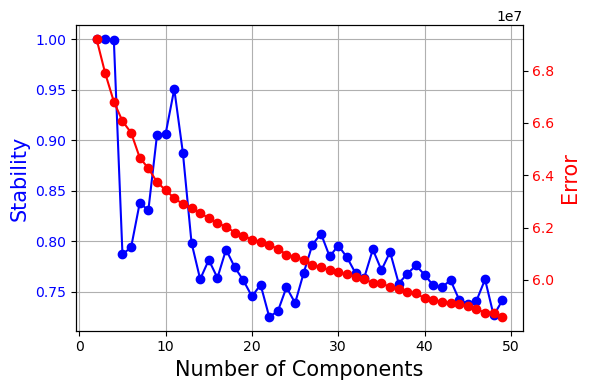

In [143]:
%%time
cnmf_obj.k_selection_plot()

In [144]:
stats = load_df_from_npz(cnmf_obj.paths['k_selection_stats'])
stats.head()

,k,local_density_threshold,silhouette,stability2,prediction_error
0,2.0,0.5,0.999986,1.000000,69208496.0
1,3.0,0.5,0.999642,1.000000,67902496.0
2,4.0,0.5,0.999273,1.000000,66816092.0
3,5.0,0.5,0.787202,0.766667,66071232.0
4,6.0,0.5,0.793959,0.333333,65626656.0


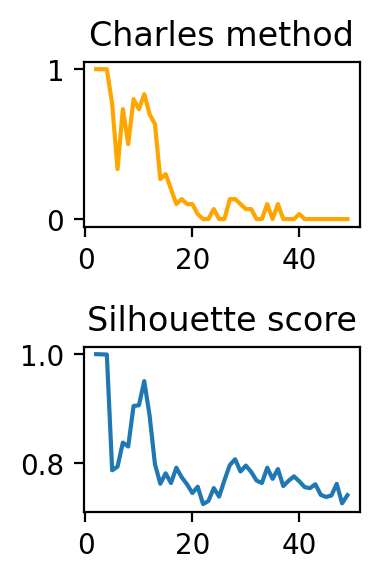

In [145]:
(fig,axes) = plt.subplots(2,1, figsize=(2,3), dpi=200)
axes[0].plot(stats['k'], stats['stability2'], label='Charles', color='orange')
axes[1].plot(stats['k'], stats['silhouette'], label='Silhouette')
axes[0].set_title('Charles method')
axes[1].set_title('Silhouette score')
plt.tight_layout()

## K = 47

/PHShome/dk718/miniforge3/envs/cnmf_env/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/PHShome/dk718/miniforge3/envs/cnmf_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


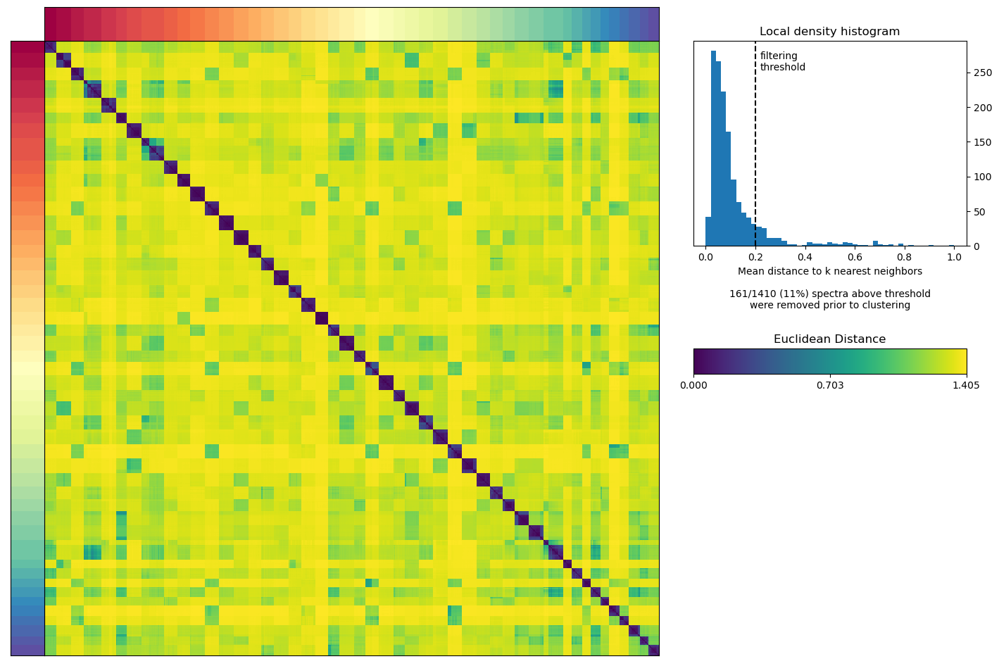

In [112]:
cnmf_obj.consensus(k=47, density_threshold=0.2)

In [113]:
(usage, spectra_scores, spectra_tpm, top_genes) = cnmf_obj.load_results(K=47, density_threshold=0.2)
top_genes.columns = ['GEP%d' % x for x in top_genes.columns]

In [114]:
top_genes.head(20).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
GEP1,RPL30,RPS15A,RPL32,RPS13,RPS23,RPL11,RPL34,CD4_prot,RPS14,RPS8,RPS27A,RPL19,RPS12,RPL35A,RPL39,RPL13,RPL37,RPS28,RPL18,RPL3
GEP2,GZMK,CD11a_prot,DUSP2,CD8_prot,AOAH,CD8A,EOMES,CD45_prot,LYAR,KLRG1_or_MAFA_prot,CMC1,DTHD1,METRNL,CD18_prot,LYST,CXCR4,CD99_prot,CST7,CXCR3,CYBA
GEP3,FTH1,PABPC1,SESN3,PASK,SARAF,CD194_or_CCR4_prot,SNED1,KRT1,FXYD5,KLF2,CD99_prot,RPS16,SPON1,CXCR4,ZFP36L2,CCR4,CD5_prot,CD29_prot,IL7R,S1PR1
GEP4,LINC02446,CD73_or_Ecto-5-nucleotidase_prot,CD8_prot,CD8B,CD31_prot,CD45RA_prot,REG4,LRRN3,KLRK1,ACTN1,CD248,PTPRK,S100B,NELL2,CD101_or_BB27_prot,SFRP5,CD8A,FCER1G,CD7_prot,NT5E
GEP5,HSP90AA1,CACYBP,HSPE1,PRDX1,PSMB6,ATP5MC3,HSP90AB1,NDUFAB1,MANF,POMP,PSMA3,PSMB2,ATP5F1B,RPS17,TXN,YBX1,PSMA7,PHB,HSPD1,PSMB1
GEP6,ACTB,PFN1,PSME2,IL32,PSME1,TMSB4X,ACTG1,TYMP,CFL1,COTL1,IFITM2,TMSB10,CORO1A,TUBB,MYL6,IDH2,CDK2AP2,PSMB10,TUBA1B,IFITM1
GEP7,NME1,NCL,NPM1,HSPD1,ODC1,NOP16,HSPE1,FABP5,SRM,DDX21,C1QBP,PYCR1,SLC29A1,NOLC1,RAN,EIF4A1,TOMM40,MRTO4,DCTPP1,PPA1
GEP8,FHIT,PDE3B,IGF1R,MBNL1,FOXP1,MAN1C1,ARHGAP15,TSHZ2,PLCL1,IMMP2L,MLLT3,PRKCA,WWOX,TNRC6B,BCL11B,SMYD3,RUNX1,BACH2,ZBTB20,SNTB1
GEP9,ALOX5,NPDC1,NEFL,PTGER2,TNFSF13B,S100A4,LTB,CD29_prot,CD49f_prot,GPR25,CD35_prot,S100A11,CISH,AQP3,CD127_or_IL-7Ra_prot,PTPN13,CD45RO_prot,SOCS2,VIM,GSTK1
GEP10,FGFBP2,GPR56_prot,GZMH,NKG7,CX3CR1,CD57Recombinant_prot,ADGRG1,PRSS23,PLEK,S1PR5,CCL5,CST7,ZEB2,FCRL6,EFHD2,LINC02384,PRF1,GNLY,KLRD1,ZNF683


## Compare to meta-geps

In [115]:
metagepinfo = pd.ExcelFile('../../../Data/Dataset_completion_log.xlsx').parse('Current Meta-program Paths').loc[0,:]
metagepinfo

clustering_fn                      /data/srlab1/TCAT/Data/TCAT/cluster_groups.pai...
merged_hvgs                        /data/srlab1/TCAT/Data/TCAT/MergedHVG.UnionAll...
tpm_norm_spectra                   /data/srlab1/TCAT/Data/TCAT/merged_spectra.Gen...
tpm_norm_spectra_withsingletons    /data/srlab1/TCAT/Data/TCAT/merged_spectra.Gen...
Name: 0, dtype: object

In [116]:
ref = pd.read_csv(metagepinfo.loc['tpm_norm_spectra'], sep='\t', index_col=0)
hvgs = pd.read_csv(metagepinfo.loc['merged_hvgs'], sep='\t', header=None)[0]

In [117]:
tpm_stats = load_df_from_npz(cnmf_obj.paths['tpm_stats'])
tpm_stats.head()

,__mean,__std
TSPAN6,0.018095,0.200150
DPM1,0.278744,0.815330
SCYL3,0.280004,0.896360
C1orf112,0.194351,0.878261
FGR,0.085740,0.609251


In [118]:
spectra_tpm_norm = spectra_tpm.loc[[x for x in spectra_tpm.index if '_prot' not in x], :]
spectra_tpm_norm = spectra_tpm_norm.div(spectra_tpm_norm.sum(axis=0), axis=1)*1e6
spectra_tpm_norm = spectra_tpm_norm.div(tpm_stats.loc[spectra_tpm_norm.index, '__std'], axis=0)

In [119]:
overlap_hvgs = list(set(hvgs).intersection(spectra_tpm_norm.index))
len(overlap_hvgs), len(hvgs)

(3235, 3393)

In [120]:
spectra_tpm_norm_hvg = spectra_tpm_norm.loc[overlap_hvgs, :]
ref_hvg = ref.loc[:, overlap_hvgs].T

'\nspectra_scores_lab = spectra_scores.copy()\nspectra_scores_lab.columns = [new2full_map[x] for x in new]\nspectra_scores_lab = spectra_scores_lab.loc[:, R_reordered.columns]\ntop_genes.columns = [new2full_map[x] for x in new]\n'

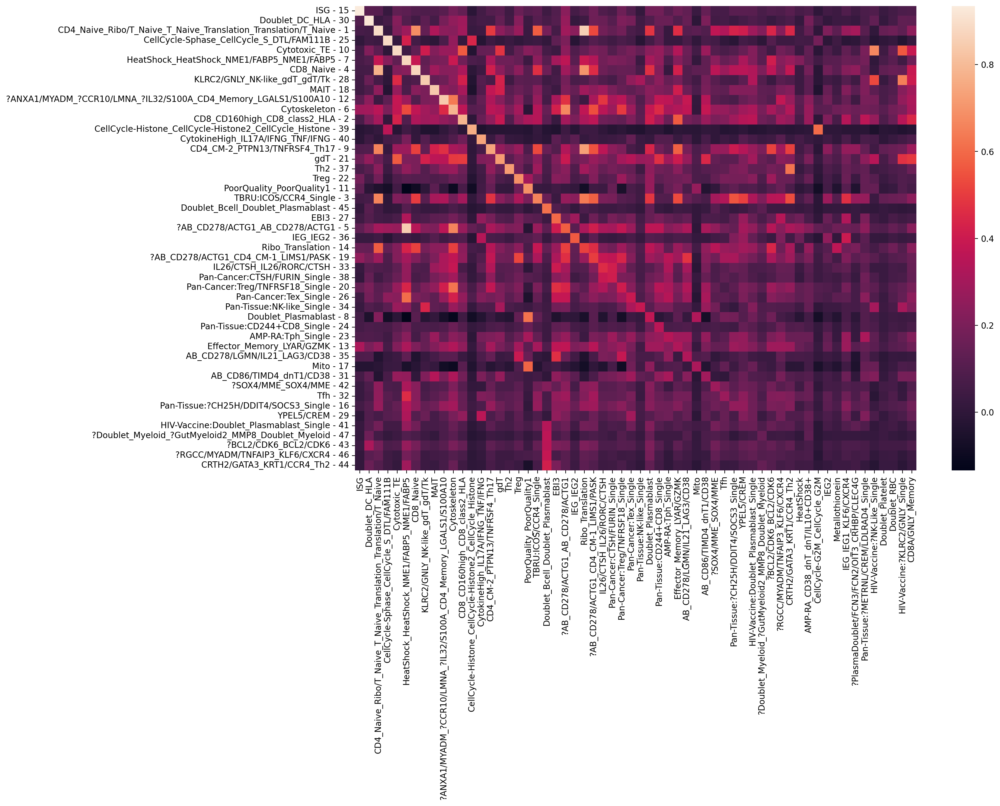

In [121]:
mapping, R = get_assignment(ref_hvg, spectra_tpm_norm_hvg)

reorder = []
for i in R.columns:
    reorder.append([i, R.at[mapping[i], i]])
    
colorder = pd.DataFrame(reorder).sort_values(by=1, ascending=False)[0]
R = R.loc[:, colorder]



mapping_reverse = {mapping[x]:x for x in mapping.keys()}
orig = R.columns
new = []
fullnew = []
for x in R.columns:
    if x in mapping:
        new.append(mapping[x])
        fullnew.append(mapping[x] + ' - ' + str(x))
    else:
        new.append(x)
        fullnew.append('Unmatched' + ' - ' + str(x))
        
new2full_map = dict(zip(new, fullnew))
new_full = [new2full_map[x] for x in new]

R.columns = new

unmatched = list(set(R.index) - set(R.columns))
overlap = list(set(R.columns).intersection(set(R.index)))



R_reordered = pd.concat([R.loc[R.columns, :], R.loc[unmatched, :]], axis=0)


R_reordered.columns = [new2full_map[x] for x in R_reordered.columns]
fig,ax = plt.subplots(1,1, figsize=(15,10), dpi=200)
sns.heatmap(R_reordered.T, ax=ax)


'''
spectra_scores_lab = spectra_scores.copy()
spectra_scores_lab.columns = [new2full_map[x] for x in new]
spectra_scores_lab = spectra_scores_lab.loc[:, R_reordered.columns]
top_genes.columns = [new2full_map[x] for x in new]
'''

In [51]:
pearsonr(spectra_tpm_norm_hvg.loc[:, 5], ref_hvg['HeatShock_HeatShock_NME1/FABP5_NME1/FABP5'])

PearsonRResult(statistic=0.7901554146377623, pvalue=0.0)

In [52]:
pearsonr(spectra_tpm_norm_hvg.loc[:, 5], ref_hvg['Cytoskeleton'])

PearsonRResult(statistic=0.7443056111621834, pvalue=0.0)

In [53]:
pearsonr(ref_hvg['HeatShock_HeatShock_NME1/FABP5_NME1/FABP5'], ref_hvg['Cytoskeleton'])


PearsonRResult(statistic=0.5791043484201731, pvalue=3.9189299249827104e-289)

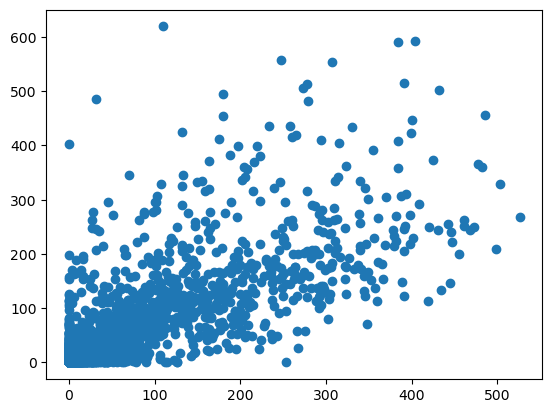

In [54]:
plt.scatter(spectra_tpm_norm_hvg.loc[:, 5], ref_hvg['HeatShock_HeatShock_NME1/FABP5_NME1/FABP5'])

In [55]:
pearsonr(spectra_tpm_norm_hvg.loc[:, 5], ref_hvg['HeatShock_HeatShock_NME1/FABP5_NME1/FABP5'])

PearsonRResult(statistic=0.7901554146377623, pvalue=0.0)

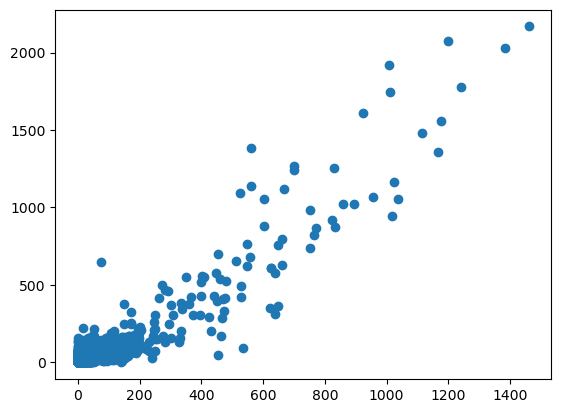

In [56]:
plt.scatter(spectra_tpm_norm_hvg.loc[:, 14], ref_hvg['ISG'])

In [21]:
R_reordered['Cytoskeleton - 5'].sort_values(ascending=False)

HeatShock_HeatShock_NME1/FABP5_NME1/FABP5                         0.790155
Cytoskeleton                                                      0.744306
?AB_CD278/ACTG1_AB_CD278/ACTG1                                    0.620187
EBI3                                                              0.447770
Pan-Cancer:Treg/TNFRSF18_Single                                   0.424258
Pan-Tissue:CD244+CD8_Single                                       0.420704
?AB_CD278/ACTG1_CD4_CM-1_LIMS1/PASK                               0.401890
?ANXA1/MYADM_?CCR10/LMNA_?IL32/S100A_CD4_Memory_LGALS1/S100A10    0.391736
AB_CD278/LGMN/IL21_LAG3/CD38                                      0.361648
AB_CD86/TIMD4_dnT1/CD38                                           0.353018
IL26/CTSH_IL26/RORC/CTSH                                          0.337537
Doublet_Plasmablast                                               0.328990
Pan-Cancer:CTSH/FURIN_Single                                      0.304918
Cytotoxic_TE             

In [101]:
pd.Series(R_reordered.columns).value_counts()

ISG - 12                                                               1
HeatShock_HeatShock_NME1/FABP5_NME1/FABP5 - 7                          1
Pan-Tissue:?METRNL/CREM/LDLRAD4_Single - 23                            1
Tfh - 24                                                               1
TBRU:ICOS/CCR4_Single - 13                                             1
gdT - 22                                                               1
Pan-Tissue:CD244+CD8_Single - 18                                       1
Doublet_Plasmablast - 8                                                1
Pan-Cancer:Tex_Single - 21                                             1
?AB_CD278/ACTG1_AB_CD278/ACTG1 - 16                                    1
?AB_CD278/ACTG1_CD4_CM-1_LIMS1/PASK - 11                               1
IL26/CTSH_IL26/RORC/CTSH - 26                                          1
EBI3 - 19                                                              1
Doublet_Bcell_Doublet_Plasmablast - 32             

In [80]:
mapping

{12: 'ISG',
 7: 'HeatShock_HeatShock_NME1/FABP5_NME1/FABP5',
 20: 'CellCycle-Sphase_CellCycle_S_DTL/FAM111B',
 9: 'Cytotoxic_TE',
 2: 'CD4_Naive_Ribo/T_Naive_T_Naive_Translation_Translation/T_Naive',
 15: 'MAIT',
 14: '?ANXA1/MYADM_?CCR10/LMNA_?IL32/S100A_CD4_Memory_LGALS1/S100A10',
 28: 'Doublet_DC_HLA',
 3: 'CD8_CD160high_CD8_class2_HLA',
 29: 'CytokineHigh_IL17A/IFNG_TNF/IFNG',
 30: 'CellCycle-Histone_CellCycle-Histone2_CellCycle_Histone',
 1: 'Ribo_Translation',
 6: 'Cytoskeleton',
 17: 'Treg',
 10: 'PoorQuality_PoorQuality1',
 27: 'Th2',
 25: 'KLRC2/GNLY_NK-like_gdT_gdT/Tk',
 5: 'CD4_CM-2_PTPN13/TNFRSF4_Th17',
 4: 'CD8_Naive',
 32: 'Doublet_Bcell_Doublet_Plasmablast',
 19: 'EBI3',
 26: 'IL26/CTSH_IL26/RORC/CTSH',
 11: '?AB_CD278/ACTG1_CD4_CM-1_LIMS1/PASK',
 16: '?AB_CD278/ACTG1_AB_CD278/ACTG1',
 21: 'Pan-Cancer:Tex_Single',
 8: 'Doublet_Plasmablast',
 18: 'Pan-Tissue:CD244+CD8_Single',
 22: 'gdT',
 13: 'TBRU:ICOS/CCR4_Single',
 24: 'Tfh',
 23: 'Pan-Tissue:?METRNL/CREM/LDLRAD4_Sing

In [79]:
R

,1,2,3,4,5,6,7,8,9,10,...,23,24,25,26,27,28,29,30,31,32
CellCycle-G2M_CellCycle_G2M,-0.005401,-0.006232,0.018375,0.058104,0.015372,0.151088,0.061749,-0.074104,-0.009265,-0.079063,...,0.023533,0.015226,0.000978,0.034409,0.010389,0.039695,0.006642,0.601569,-0.008518,-0.020548
ISG,0.057774,0.064832,0.110256,0.172445,0.182403,0.167455,0.068746,0.039199,0.066618,0.112274,...,-0.010473,0.010830,0.044432,0.012948,0.078463,0.048702,-0.006403,-0.018246,0.010392,0.005763
gdT,0.257002,0.253439,0.435814,0.292212,0.304910,0.263383,0.182317,-0.009496,0.539364,0.024259,...,0.131414,0.073967,0.407374,0.090915,0.160975,0.104685,0.123835,-0.020777,0.037568,0.014922
Metallothionein,0.116237,0.124594,0.080239,0.256307,0.118260,0.169390,0.123809,-0.032667,0.039369,-0.043050,...,0.038740,0.037759,0.041826,0.084654,0.062110,0.047287,0.009401,-0.000634,0.037759,0.017869
CellCycle-Sphase_CellCycle_S_DTL/FAM111B,0.014390,0.019057,0.035895,0.122468,0.051653,0.287278,0.237597,-0.058857,-0.000954,-0.060233,...,0.098119,0.092825,0.102239,0.071749,0.048531,0.076215,0.048965,0.361150,0.057674,0.000371
Doublet_RBC,0.171685,0.165962,0.160767,0.191084,0.178155,0.144793,0.120822,0.046268,0.149466,0.030240,...,0.054355,0.069151,0.080001,0.060099,0.086622,0.054720,0.037130,-0.014988,0.036272,0.011629
CellCycle-Histone_CellCycle-Histone2_CellCycle_Histone,0.018031,0.010919,0.009421,0.068875,0.025513,0.145818,0.089507,-0.078988,-0.031271,-0.087724,...,0.017886,0.015466,0.006824,0.005942,0.001190,0.022166,0.007614,0.763009,-0.007204,-0.027523
HeatShock,0.075652,0.051471,0.077620,0.048481,0.066453,0.258300,0.223639,-0.019453,0.038942,0.004115,...,0.075529,0.186226,0.060655,0.048176,0.038726,0.024657,0.068503,-0.007009,0.057493,0.021649
Mito,0.121869,0.130146,0.130830,0.052932,0.069172,-0.011960,0.014943,0.378896,0.076473,0.259072,...,0.024878,0.046224,0.033862,0.003473,0.067672,-0.007476,-0.007787,-0.012010,0.002121,0.010670
?ANXA1/MYADM_?CCR10/LMNA_?IL32/S100A_CD4_Memory_LGALS1/S100A10,0.329001,0.247507,0.314526,0.310422,0.473192,0.392047,0.217623,-0.078964,0.284173,0.001202,...,0.092990,0.142194,0.134601,0.248934,0.319476,0.163330,0.053989,0.013536,0.066787,0.037714


In [76]:
for i in R.columns:
    break
    
mapping_reverse[i]

1

In [77]:
mapping

{12: 'ISG',
 7: 'HeatShock_HeatShock_NME1/FABP5_NME1/FABP5',
 20: 'CellCycle-Sphase_CellCycle_S_DTL/FAM111B',
 9: 'Cytotoxic_TE',
 2: 'CD4_Naive_Ribo/T_Naive_T_Naive_Translation_Translation/T_Naive',
 15: 'MAIT',
 14: '?ANXA1/MYADM_?CCR10/LMNA_?IL32/S100A_CD4_Memory_LGALS1/S100A10',
 28: 'Doublet_DC_HLA',
 3: 'CD8_CD160high_CD8_class2_HLA',
 29: 'CytokineHigh_IL17A/IFNG_TNF/IFNG',
 30: 'CellCycle-Histone_CellCycle-Histone2_CellCycle_Histone',
 1: 'Ribo_Translation',
 6: 'Cytoskeleton',
 17: 'Treg',
 10: 'PoorQuality_PoorQuality1',
 27: 'Th2',
 25: 'KLRC2/GNLY_NK-like_gdT_gdT/Tk',
 5: 'CD4_CM-2_PTPN13/TNFRSF4_Th17',
 4: 'CD8_Naive',
 32: 'Doublet_Bcell_Doublet_Plasmablast',
 19: 'EBI3',
 26: 'IL26/CTSH_IL26/RORC/CTSH',
 11: '?AB_CD278/ACTG1_CD4_CM-1_LIMS1/PASK',
 16: '?AB_CD278/ACTG1_AB_CD278/ACTG1',
 21: 'Pan-Cancer:Tex_Single',
 8: 'Doublet_Plasmablast',
 18: 'Pan-Tissue:CD244+CD8_Single',
 22: 'gdT',
 13: 'TBRU:ICOS/CCR4_Single',
 24: 'Tfh',
 23: 'Pan-Tissue:?METRNL/CREM/LDLRAD4_Sing

<AxesSubplot: >

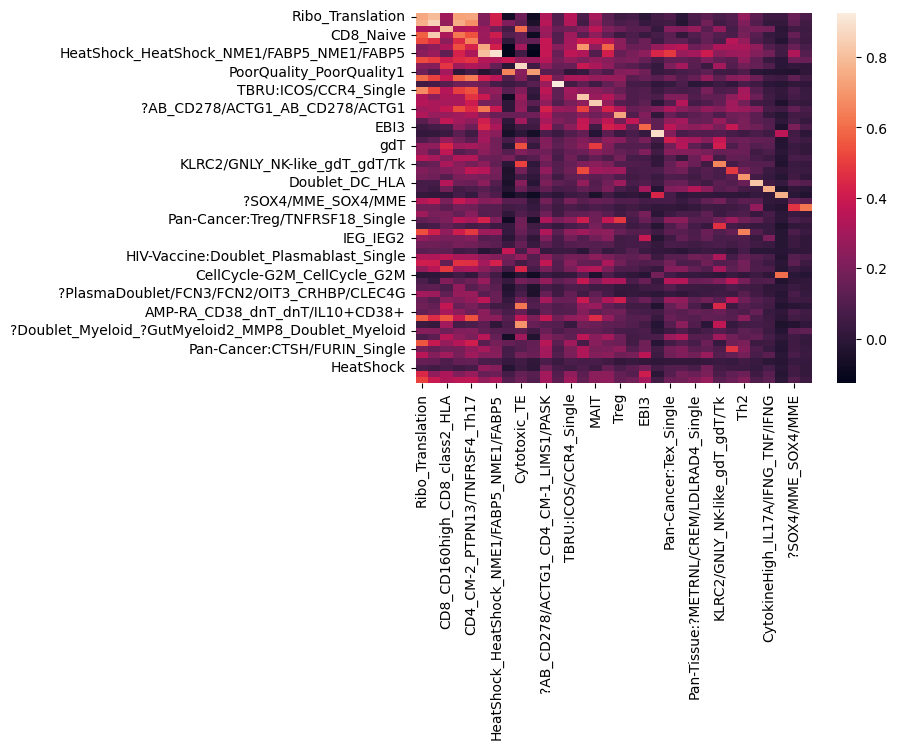

In [68]:
sns.heatmap(R_reordered)

In [71]:
new_full

['Ribo_Translation - 1',
 'CD4_Naive_Ribo/T_Naive_T_Naive_Translation_Translation/T_Naive - 2',
 'CD8_CD160high_CD8_class2_HLA - 3',
 'CD8_Naive - 4',
 'CD4_CM-2_PTPN13/TNFRSF4_Th17 - 5',
 'Cytoskeleton - 6',
 'HeatShock_HeatShock_NME1/FABP5_NME1/FABP5 - 7',
 'Doublet_Plasmablast - 8',
 'Cytotoxic_TE - 9',
 'PoorQuality_PoorQuality1 - 10',
 '?AB_CD278/ACTG1_CD4_CM-1_LIMS1/PASK - 11',
 'ISG - 12',
 'TBRU:ICOS/CCR4_Single - 13',
 '?ANXA1/MYADM_?CCR10/LMNA_?IL32/S100A_CD4_Memory_LGALS1/S100A10 - 14',
 'MAIT - 15',
 '?AB_CD278/ACTG1_AB_CD278/ACTG1 - 16',
 'Treg - 17',
 'Pan-Tissue:CD244+CD8_Single - 18',
 'EBI3 - 19',
 'CellCycle-Sphase_CellCycle_S_DTL/FAM111B - 20',
 'Pan-Cancer:Tex_Single - 21',
 'gdT - 22',
 'Pan-Tissue:?METRNL/CREM/LDLRAD4_Single - 23',
 'Tfh - 24',
 'KLRC2/GNLY_NK-like_gdT_gdT/Tk - 25',
 'IL26/CTSH_IL26/RORC/CTSH - 26',
 'Th2 - 27',
 'Doublet_DC_HLA - 28',
 'CytokineHigh_IL17A/IFNG_TNF/IFNG - 29',
 'CellCycle-Histone_CellCycle-Histone2_CellCycle_Histone - 30',
 '?SOX4

In [62]:
, R.loc[:, unmatched]

[]

In [55]:
outfn = '/data/srlab1/dk718/Tcell_cNMF_Comparison/Data/HaoEtAl_PBMC/T_learnHarmonyRNA_RefitBoth/T_learnHarmonyRNA_RefitBoth.gene_spectra_score.k_36.dt_0_2.labeled.txt'
orig_spectra_labeled = pd.read_csv(outfn, sep='\t', index_col=0)
orig_spectra_labeled.head()

,CD4_Naive,?MTRNR2L12,?TXNIP/H3F3B,Translation,CD8_Naive,PoorQuality,CD4_CM-1,Cytotoxic,Effector_Memory,Cytoskeleton,...,HLA,dnT,CellCycle_S,Doublet_Platelet,CellCycle_G2M,CellCycle_Histone,Th2,Doublet_Plasmablast,?HIST1H4H/CCDC173,Doublet_RBC
LINC00115,-0.000047,0.000107,-0.000113,-0.000556,0.000120,0.000258,1.129847e-04,0.000007,0.000023,-0.000065,...,-0.000057,0.000299,-0.000081,-0.000257,-0.000004,0.000114,-0.000215,-0.000137,-0.000427,0.000133
FAM41C,0.000081,0.000308,-0.000463,-0.000421,0.000094,-0.000168,7.271318e-07,0.000104,0.000415,-0.000323,...,-0.000263,-0.000071,0.000054,0.000128,0.000209,-0.000247,-0.000208,0.000100,-0.000070,-0.000055
NOC2L,0.000100,0.000531,-0.000841,-0.001774,0.000335,0.000487,3.913925e-05,-0.000020,-0.000097,-0.000156,...,0.000913,-0.000070,0.000116,-0.000401,-0.000025,-0.000175,0.000046,-0.000336,-0.000250,0.000028
KLHL17,-0.000102,0.000086,0.000049,-0.000572,0.000047,0.000212,2.026965e-04,0.000032,0.000089,0.000217,...,0.000366,0.000208,-0.000172,0.000032,-0.000016,0.000371,0.000065,-0.000046,0.000400,-0.000326
PLEKHN1,-0.000148,-0.000053,-0.000238,-0.000241,-0.000154,0.000054,-9.401168e-05,-0.000171,0.000597,0.000219,...,-0.000084,0.000171,-0.000087,-0.000152,-0.000079,0.000033,-0.000154,0.000057,-0.000520,-0.000221


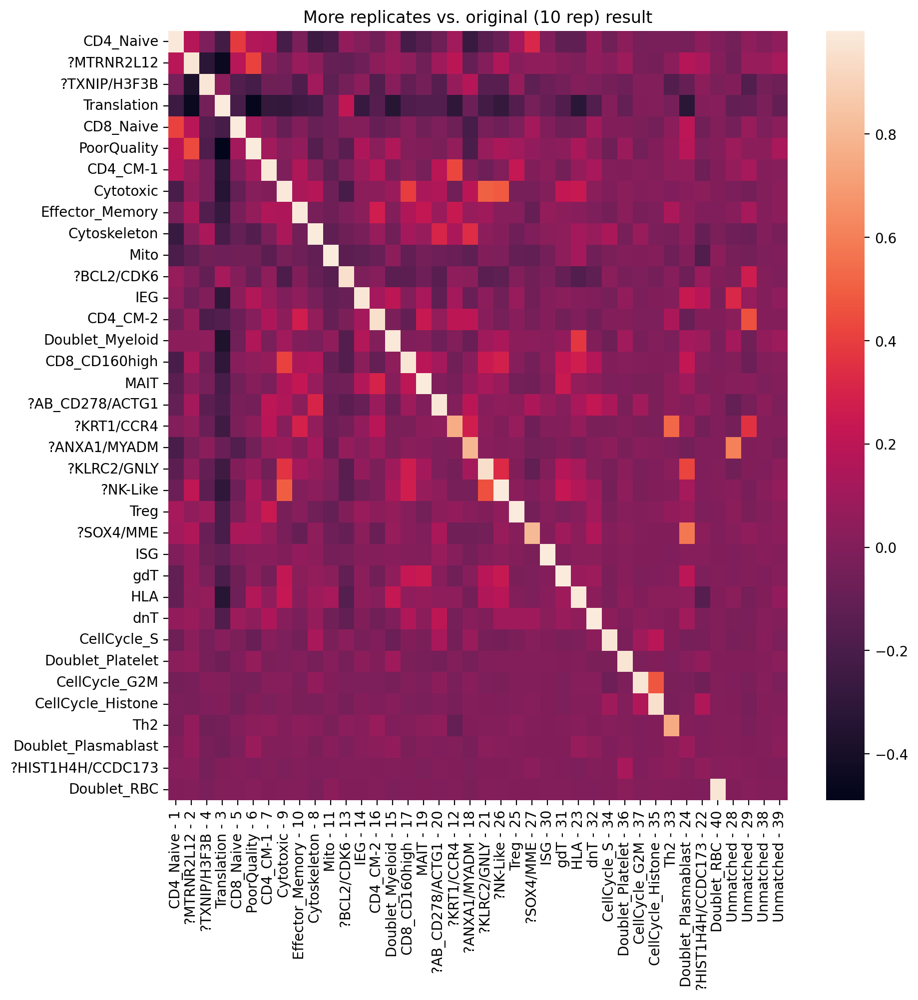

In [56]:
mapping, R = get_assignment(orig_spectra_labeled, spectra_scores)
mapping_reverse = {mapping[x]:x for x in mapping.keys()}
orig = R.columns
new = []
fullnew = []
for x in R.columns:
    if x in mapping:
        new.append(mapping[x])
        fullnew.append(mapping[x] + ' - ' + str(x))
    else:
        new.append(x)
        fullnew.append('Unmatched' + ' - ' + str(x))
        
new2full_map = dict(zip(new, fullnew))
new_full = [new2full_map[x] for x in new]

R.columns = new
unmatched = list(set(R.columns) - set(R.index))
R_reordered = pd.concat([R.loc[:, R.index], R.loc[:, unmatched]], axis=1)
R_reordered.columns = [new2full_map[x] for x in R_reordered.columns]
fig,ax = plt.subplots(1,1, figsize=(10,10), dpi=200)
sns.heatmap(R_reordered, ax=ax)
ax.set_title('More replicates vs. original (10 rep) result')

spectra_scores_lab = spectra_scores.copy()
spectra_scores_lab.columns = [new2full_map[x] for x in new]
spectra_scores_lab = spectra_scores_lab.loc[:, R_reordered.columns]
top_genes.columns = [new2full_map[x] for x in new]


True     35
False     5
dtype: int64

Text(0.5, 1.0, 'More replicates Hao vs. pan-dataset merge')

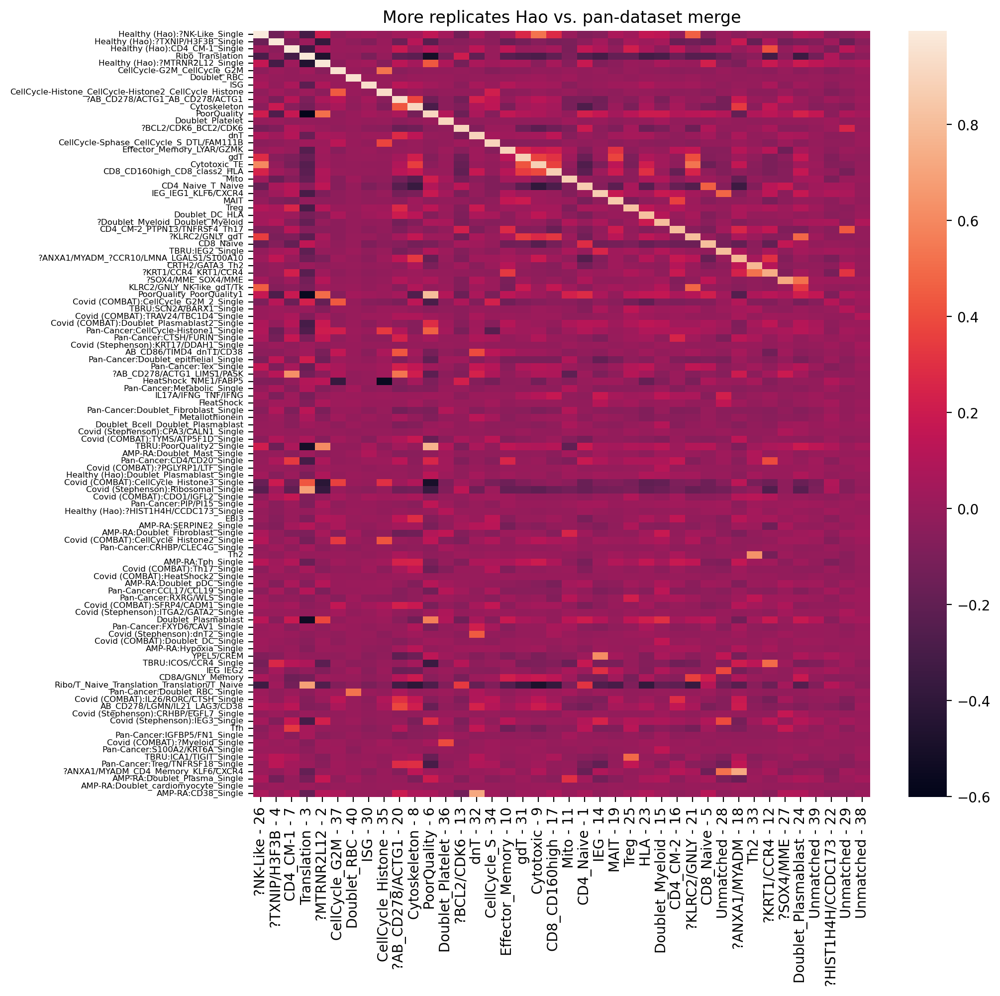

In [57]:
specfn = '/data/srlab1/mcurtis/GSK/tcell_proliferation/TCellAnnotator/cache/gene_scores_grouped.pairwiseCorr.Z_HVGunion.2022.08.19.txt'
consensus_spec = pd.read_csv(specfn, sep='\t', index_col=0).T
overlap = list(set(spectra_scores_lab.index).intersection(consensus_spec.index))

(mapping, R) = get_assignment(consensus_spec.loc[overlap,:], spectra_scores_lab.loc[overlap,:])
mapping33 = pd.Series(mapping).sort_index()
mapping33_maxR = pd.Series({i:R.at[mapping33[i], i] for i in mapping33.keys()})
display((mapping33_maxR>.6).value_counts())

colorder = mapping33_maxR.sort_values(ascending=False).index
roworder = [mapping33[x] for x in colorder]
roworder +=  list(set(R.index) - set(roworder))
(fig,ax) = plt.subplots(1,1, figsize=(10,10), dpi=200)
sns.heatmap(R.loc[roworder, colorder], ax=ax,  yticklabels=True)
_ = ax.set_yticklabels(roworder, fontsize=6)
ax.set_title('More replicates Hao vs. pan-dataset merge')


True     34
False     4
dtype: int64

Text(0.5, 1.0, 'learn with ADT vs. no ADT')

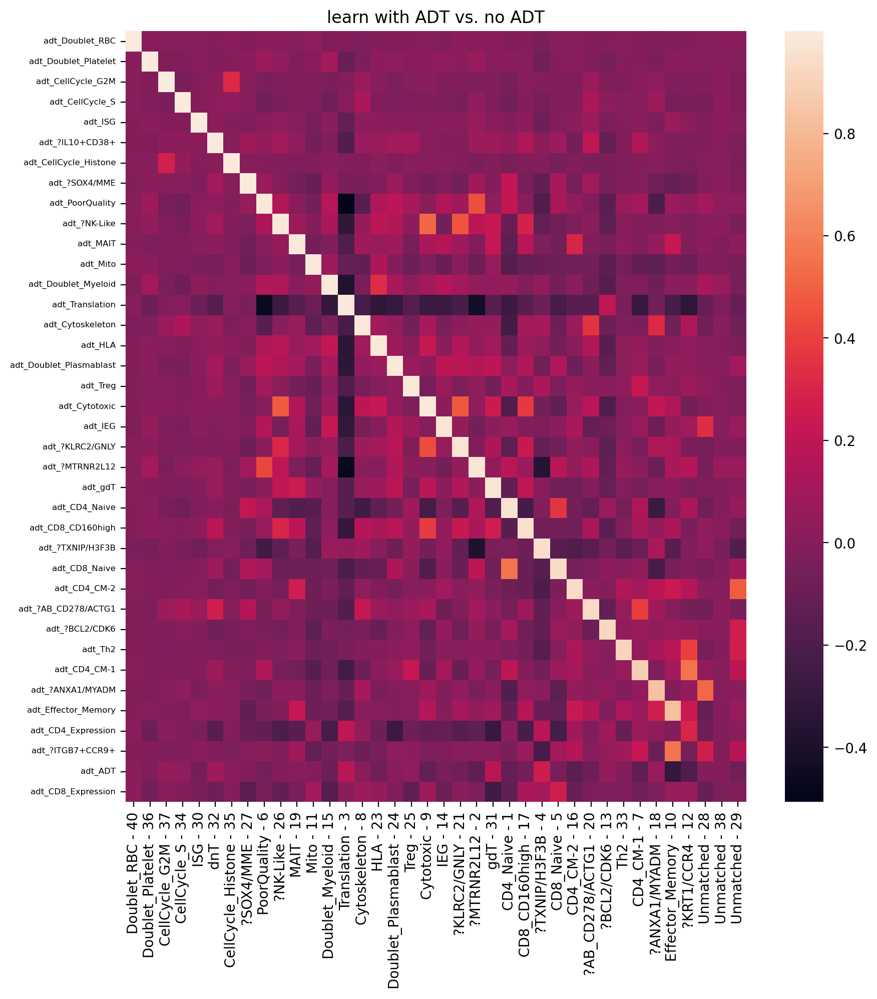

In [58]:
with_adt = pd.read_csv('../../Data/HaoEtAl_PBMC/T_learnHarmonyBoth_RefitBoth_20221022/T_learnHarmonyBoth_RefitBoth_20221022.gene_spectra_score.k_38.dt_0_2.labeled.txt', sep='\t',index_col=0)
with_adt.columns = ['adt_' + x for x in with_adt.columns]

mapping, R = get_assignment(with_adt, spectra_scores_lab)
mapping_reverse = {mapping[x]:x for x in mapping.keys()}

overlap = list(set(spectra_scores_lab.index).intersection(with_adt.index))

(mapping, R) = get_assignment(with_adt.loc[overlap,:], spectra_scores_lab.loc[overlap,:])
mapping33 = pd.Series(mapping).sort_index()
mapping33_maxR = pd.Series({i:R.at[mapping33[i], i] for i in mapping33.keys()})
display((mapping33_maxR>.6).value_counts())

colorder = mapping33_maxR.sort_values(ascending=False).index
roworder = [mapping33[x] for x in colorder]
roworder +=  list(set(R.index) - set(roworder))
(fig,ax) = plt.subplots(1,1, figsize=(10,10), dpi=200)
sns.heatmap(R.loc[roworder, colorder], ax=ax,  yticklabels=True)
_ = ax.set_yticklabels(roworder, fontsize=6)
ax.set_title('learn with ADT vs. no ADT')

In [59]:
top_genes.head(20).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
CD4_Naive - 1,IL6ST,CCR7,FHIT,SELL,PIK3IP1,SATB1,FOXP1,LEF1,TCF7,FYB1,NOSIP,CHRM3-AS2,AB_GP130,TRABD2A,ANKRD55,LINC00861,TSHZ2,ADTRP,AB_CD109,ETS1
?MTRNR2L12 - 2,MTRNR2L8,MTRNR2L12,CWC22,GIMAP7,CHD4,TRIP11,NOC3L,AB_CD93,KIAA1551,SLFN5,LEO1,MALAT1,AB_CD307e,TOP1,RPAP3,HSPH1,DDX52,EIF5B,GPATCH11,RPAP2
Translation - 3,RPS18,RPS8,RPS6,RPS12,RPS4X,RPL3,RPS3,EEF1A1,RPS27A,RPL13,RPS3A,RPLP1,RPS14,TPT1,RPL10,RPS15A,EEF1B2,RPL21,RPS2,RPL34
?TXNIP/H3F3B - 4,TXNIP,BTG1,H3F3B,MALAT1,H1FX,RPS4Y1,PTMA,B2M,TSC22D3,RPL36AL,KLF2,TMSB4X,SRSF5,ITM2B,CXCR4,TRBC2,FTL,HLA-A,EIF1,TRAC
CD8_Naive - 5,AB_CD8,LINC02446,AB_CD8a,CD8B,AB_CD73,NELL2,S100B,AB_CD55,CARS,AB_CD45RA,ACTN1,PASK,PDE3B,AB_CD31,AB_CD314,OXNAD1,YBX3,CD8A,CCR7,CLEC11A
PoorQuality - 6,MALAT1,MACF1,UTRN,SYNE2,GOLGB1,GOLGA4,SYNE1,SMCHD1,RNF213,AHNAK,MYH9,ANKRD36C,HNRNPU,TUT7,HNRNPA2B1,SLFN12L,KIAA1109,NKTR,ITGA4,NEAT1
CD4_CM-1 - 7,LIMS1,PASK,GPR183,MAF,AP3M2,FYB1,TSHZ2,TBC1D4,ST8SIA1,ARID5B,ITM2A,TMEM156,AB_CD45RO,AB_CD278,TP53INP1,AQP3,LINC00402,EPHA4,SESN3,AB_CD95
Cytoskeleton - 8,ACTB,PFN1,ACTG1,CFL1,LCP1,CALR,HCST,CLIC1,ARPC2,TMSB4X,CORO1A,MYL6,TPM4,MYL12A,SH3BGRL3,S100A4,IFITM2,CALM1,HSPA5,IL32
Cytotoxic - 9,FGFBP2,GZMH,PROK2,NKG7,GZMB,EFHD2,CST7,LINC02384,C1orf21,ZEB2,PRSS23,TGFBR3,ADGRG1,ITGB1,CX3CR1,ASCL2,CD8A,AB_CD271,B2M,KIF19
Effector_Memory - 10,IL7R,LYAR,ITGA1,PTGER2,CXCR3,CYB561,IGFBP3,GBP5,IFNG-AS1,CCR9,NSG1,PARP8,ITGA4,AB_CD49a,PRDM1,ANTXR2,GPR171,AB_Integrin-7,AB_CD2,AB_CD127


In [60]:
specfn = '/data/srlab1/dk718/Tcell_cNMF_Comparison/Data/HaoEtAl_PBMC/T_learnHarmonyRNA_RefitBoth_20221022/T_learnHarmonyRNA_RefitBoth_20221022.gene_spectra_score.k_35.dt_0_2.labeled.txt'
spec35 = pd.read_csv(specfn, sep='\t', index_col=0)

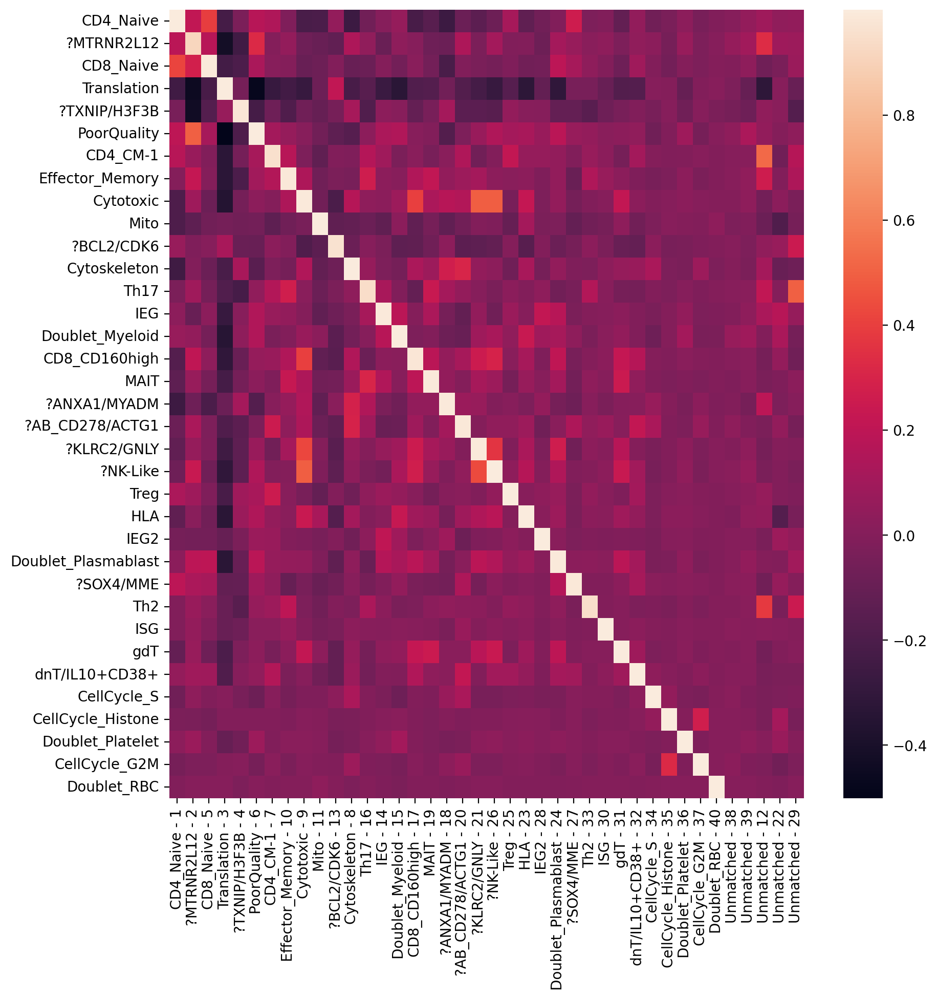

In [61]:
mapping, R = get_assignment(spec35, spectra_scores)
mapping_reverse = {mapping[x]:x for x in mapping.keys()}
orig = R.columns
new = []
fullnew = []
for x in R.columns:
    if x in mapping:
        new.append(mapping[x])
        fullnew.append(mapping[x] + ' - ' + str(x))
    else:
        new.append(x)
        fullnew.append('Unmatched' + ' - ' + str(x))
        
new2full_map = dict(zip(new, fullnew))
new_full = [new2full_map[x] for x in new]

R.columns = new
unmatched = list(set(R.columns) - set(R.index))
R_reordered = pd.concat([R.loc[:, R.index], R.loc[:, unmatched]], axis=1)
R_reordered.columns = [new2full_map[x] for x in R_reordered.columns]
fig,ax = plt.subplots(1,1, figsize=(10,10), dpi=200)
sns.heatmap(R_reordered, ax=ax)
top_genes.columns = [new2full_map[x] for x in new]


In [62]:
top_genes.head(20).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
CD4_Naive - 1,IL6ST,CCR7,FHIT,SELL,PIK3IP1,SATB1,FOXP1,LEF1,TCF7,FYB1,NOSIP,CHRM3-AS2,AB_GP130,TRABD2A,ANKRD55,LINC00861,TSHZ2,ADTRP,AB_CD109,ETS1
?MTRNR2L12 - 2,MTRNR2L8,MTRNR2L12,CWC22,GIMAP7,CHD4,TRIP11,NOC3L,AB_CD93,KIAA1551,SLFN5,LEO1,MALAT1,AB_CD307e,TOP1,RPAP3,HSPH1,DDX52,EIF5B,GPATCH11,RPAP2
Translation - 3,RPS18,RPS8,RPS6,RPS12,RPS4X,RPL3,RPS3,EEF1A1,RPS27A,RPL13,RPS3A,RPLP1,RPS14,TPT1,RPL10,RPS15A,EEF1B2,RPL21,RPS2,RPL34
?TXNIP/H3F3B - 4,TXNIP,BTG1,H3F3B,MALAT1,H1FX,RPS4Y1,PTMA,B2M,TSC22D3,RPL36AL,KLF2,TMSB4X,SRSF5,ITM2B,CXCR4,TRBC2,FTL,HLA-A,EIF1,TRAC
CD8_Naive - 5,AB_CD8,LINC02446,AB_CD8a,CD8B,AB_CD73,NELL2,S100B,AB_CD55,CARS,AB_CD45RA,ACTN1,PASK,PDE3B,AB_CD31,AB_CD314,OXNAD1,YBX3,CD8A,CCR7,CLEC11A
PoorQuality - 6,MALAT1,MACF1,UTRN,SYNE2,GOLGB1,GOLGA4,SYNE1,SMCHD1,RNF213,AHNAK,MYH9,ANKRD36C,HNRNPU,TUT7,HNRNPA2B1,SLFN12L,KIAA1109,NKTR,ITGA4,NEAT1
CD4_CM-1 - 7,LIMS1,PASK,GPR183,MAF,AP3M2,FYB1,TSHZ2,TBC1D4,ST8SIA1,ARID5B,ITM2A,TMEM156,AB_CD45RO,AB_CD278,TP53INP1,AQP3,LINC00402,EPHA4,SESN3,AB_CD95
Cytoskeleton - 8,ACTB,PFN1,ACTG1,CFL1,LCP1,CALR,HCST,CLIC1,ARPC2,TMSB4X,CORO1A,MYL6,TPM4,MYL12A,SH3BGRL3,S100A4,IFITM2,CALM1,HSPA5,IL32
Cytotoxic - 9,FGFBP2,GZMH,PROK2,NKG7,GZMB,EFHD2,CST7,LINC02384,C1orf21,ZEB2,PRSS23,TGFBR3,ADGRG1,ITGB1,CX3CR1,ASCL2,CD8A,AB_CD271,B2M,KIF19
Effector_Memory - 10,IL7R,LYAR,ITGA1,PTGER2,CXCR3,CYB561,IGFBP3,GBP5,IFNG-AS1,CCR9,NSG1,PARP8,ITGA4,AB_CD49a,PRDM1,ANTXR2,GPR171,AB_Integrin-7,AB_CD2,AB_CD127


In [63]:
specfn = cnmf_obj.paths['gene_spectra_score__txt'] % (40, '0_2')
specfn = os.path.abspath(specfn.replace('.txt', '.labeled.txt'))
print(specfn)
spectra_scores_lab.to_csv(specfn, sep='\t')

/data/srlab1/dk718/Tcell_cNMF_Comparison/Data/HaoEtAl_PBMC/T_learnHarmonyRNA_RefitBoth_20221022/T_learnHarmonyRNA_RefitBoth_20221022.gene_spectra_score.k_40.dt_0_2.labeled.txt


In [66]:
usage.columns = [new2full_map[x] for x in new]

In [64]:
umap = pd.read_csv(paths['WNN_UMAP'], sep='\t', index_col=0)

0.7130611444527623

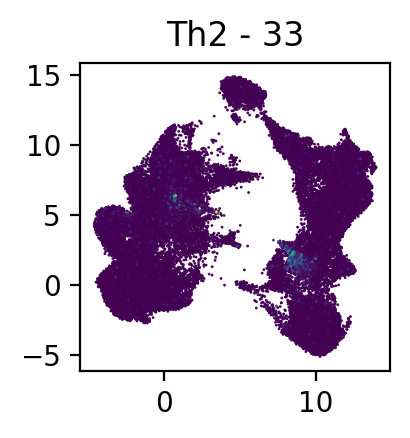

In [75]:
(fig,ax) = plt.subplots(1,1, figsize=(2,2), dpi=200)
g = 'Th2 - 33'
v = usage[g].quantile(.9999)
ax.scatter(umap['WNN_UMAP_1'], umap['WNN_UMAP_2'], c=usage.loc[umap.index, g], vmin=0, vmax=v, s=1, edgecolor='None')
ax.set_title(g)
v

0.34936303061379537

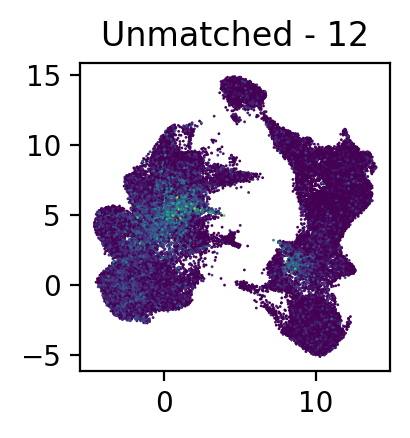

In [74]:
(fig,ax) = plt.subplots(1,1, figsize=(2,2), dpi=200)
g = 'Unmatched - 12'
v = usage[g].quantile(.9999)
ax.scatter(umap['WNN_UMAP_1'], umap['WNN_UMAP_2'], c=usage.loc[umap.index, g], vmin=0, vmax=v, s=1, edgecolor='None')
ax.set_title(g)
v

# K=37

/PHShome/dk718/miniforge3/envs/cnmf_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


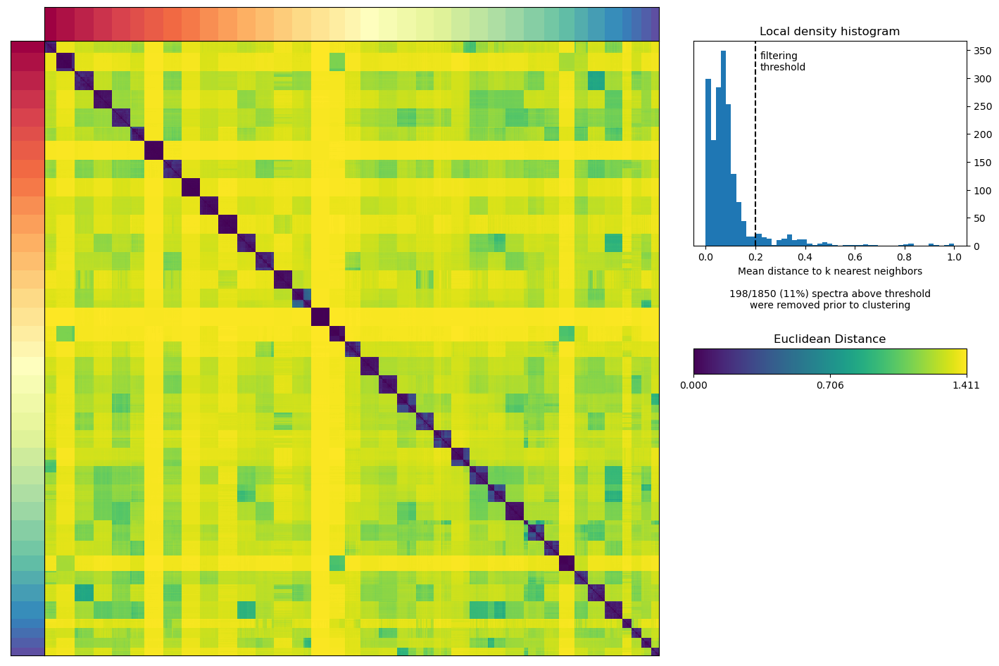

In [29]:
cnmf_obj.consensus(k=37, density_threshold=0.20)

In [40]:
(usage, spectra_scores, spectra_tpm, top_genes) = cnmf_obj.load_results(K=37, density_threshold=0.2)
top_genes.columns = ['GEP%d' % x for x in top_genes.columns]

In [41]:
top_genes.head(20).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
GEP1,IL6ST,CCR7,FHIT,SELL,PIK3IP1,SATB1,LEF1,FOXP1,TCF7,FYB1,AB_GP130,TRABD2A,NOSIP,CHRM3-AS2,ANKRD55,LINC00861,ADTRP,AB_CD109,TSHZ2,TTN
GEP2,MTRNR2L8,MTRNR2L12,CWC22,CHD4,KIAA1551,TRIP11,AB_CD307e,AB_CD93,NOC3L,GIMAP7,SLFN5,MALAT1,LEO1,HSPH1,RPAP3,TOP1,PLCG2,DDX52,GOLGA4,GPATCH11
GEP3,TXNIP,BTG1,H3F3B,MALAT1,H1FX,RPS4Y1,PTMA,TSC22D3,B2M,KLF2,RPL36AL,TMSB4X,CXCR4,TRBC2,SRSF5,ITM2B,TMSB10,HLA-A,TRAC,EIF1
GEP4,RPS18,RPS8,RPS6,RPS12,RPS4X,RPL3,RPS3,EEF1A1,RPS27A,RPL13,RPS3A,RPLP1,RPS14,TPT1,RPL10,RPS15A,EEF1B2,RPL21,RPS2,RPL34
GEP5,AB_CD8,LINC02446,AB_CD8a,CD8B,AB_CD73,NELL2,S100B,AB_CD55,CARS,AB_CD45RA,PASK,ACTN1,AB_CD31,PDE3B,AB_CD314,OXNAD1,YBX3,CD8A,CCR7,CLEC11A
GEP6,LIMS1,PASK,GPR183,AP3M2,FYB1,AB_CD45RO,TSHZ2,ARID5B,MAF,ST8SIA1,ITM2A,TBC1D4,CD84,AQP3,CORO1B,LINC00402,EPHA4,TP53INP1,TRADD,AB_CD278
GEP7,MALAT1,MACF1,UTRN,SYNE2,GOLGB1,GOLGA4,SYNE1,SMCHD1,RNF213,AHNAK,MYH9,ANKRD36C,HNRNPU,TUT7,SLFN12L,HNRNPA2B1,ITGA4,KIAA1109,NKTR,NEAT1
GEP8,IL7R,LYAR,ITGA1,PTGER2,CXCR3,CYB561,GBP5,IGFBP3,IFNG-AS1,CCR9,PARP8,PRDM1,NSG1,ANTXR2,GPR171,AB_CD49a,ITGA4,AB_CD2,AB_CD127,SAMSN1
GEP9,ACTB,PFN1,ACTG1,CFL1,LCP1,CALR,HCST,CLIC1,ARPC2,TMSB4X,CORO1A,MYL6,TPM4,MYL12A,SH3BGRL3,S100A4,IFITM2,CALM1,PDIA3,HSPA5
GEP10,FGFBP2,GZMH,PROK2,NKG7,GZMB,EFHD2,CST7,LINC02384,C1orf21,ZEB2,PRSS23,TGFBR3,ADGRG1,ASCL2,AB_CD271,ITGB1,CX3CR1,CCL5,CD8A,PLEK


In [42]:
outfn = '/data/srlab1/dk718/Tcell_cNMF_Comparison/Data/HaoEtAl_PBMC/T_learnHarmonyRNA_RefitBoth/T_learnHarmonyRNA_RefitBoth.gene_spectra_score.k_36.dt_0_2.labeled.txt'
orig_spectra_labeled = pd.read_csv(outfn, sep='\t', index_col=0)
orig_spectra_labeled.head()

,CD4_Naive,?MTRNR2L12,?TXNIP/H3F3B,Translation,CD8_Naive,PoorQuality,CD4_CM-1,Cytotoxic,Effector_Memory,Cytoskeleton,...,HLA,dnT,CellCycle_S,Doublet_Platelet,CellCycle_G2M,CellCycle_Histone,Th2,Doublet_Plasmablast,?HIST1H4H/CCDC173,Doublet_RBC
LINC00115,-0.000047,0.000107,-0.000113,-0.000556,0.000120,0.000258,1.129847e-04,0.000007,0.000023,-0.000065,...,-0.000057,0.000299,-0.000081,-0.000257,-0.000004,0.000114,-0.000215,-0.000137,-0.000427,0.000133
FAM41C,0.000081,0.000308,-0.000463,-0.000421,0.000094,-0.000168,7.271318e-07,0.000104,0.000415,-0.000323,...,-0.000263,-0.000071,0.000054,0.000128,0.000209,-0.000247,-0.000208,0.000100,-0.000070,-0.000055
NOC2L,0.000100,0.000531,-0.000841,-0.001774,0.000335,0.000487,3.913925e-05,-0.000020,-0.000097,-0.000156,...,0.000913,-0.000070,0.000116,-0.000401,-0.000025,-0.000175,0.000046,-0.000336,-0.000250,0.000028
KLHL17,-0.000102,0.000086,0.000049,-0.000572,0.000047,0.000212,2.026965e-04,0.000032,0.000089,0.000217,...,0.000366,0.000208,-0.000172,0.000032,-0.000016,0.000371,0.000065,-0.000046,0.000400,-0.000326
PLEKHN1,-0.000148,-0.000053,-0.000238,-0.000241,-0.000154,0.000054,-9.401168e-05,-0.000171,0.000597,0.000219,...,-0.000084,0.000171,-0.000087,-0.000152,-0.000079,0.000033,-0.000154,0.000057,-0.000520,-0.000221


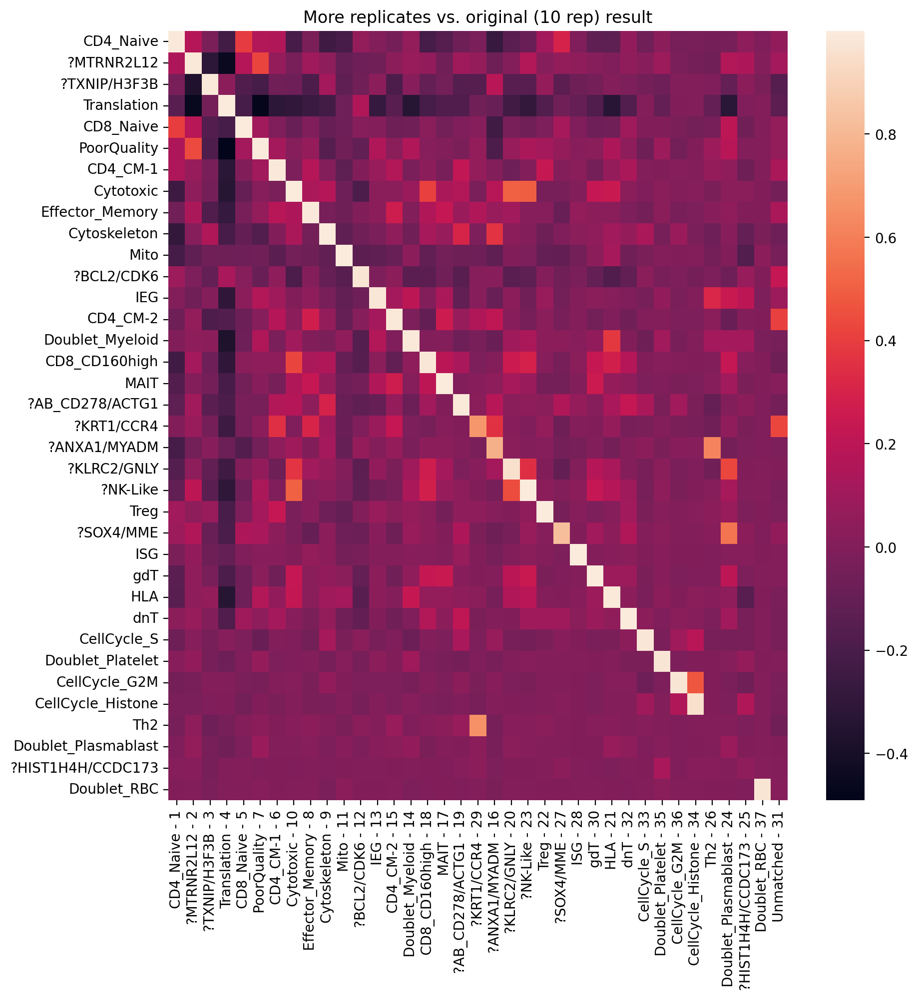

In [43]:
mapping, R = get_assignment(orig_spectra_labeled, spectra_scores)
mapping_reverse = {mapping[x]:x for x in mapping.keys()}
orig = R.columns
new = []
fullnew = []
for x in R.columns:
    if x in mapping:
        new.append(mapping[x])
        fullnew.append(mapping[x] + ' - ' + str(x))
    else:
        new.append(x)
        fullnew.append('Unmatched' + ' - ' + str(x))
        
new2full_map = dict(zip(new, fullnew))
new_full = [new2full_map[x] for x in new]

R.columns = new
unmatched = list(set(R.columns) - set(R.index))
R_reordered = pd.concat([R.loc[:, R.index], R.loc[:, unmatched]], axis=1)
R_reordered.columns = [new2full_map[x] for x in R_reordered.columns]
fig,ax = plt.subplots(1,1, figsize=(10,10), dpi=200)
sns.heatmap(R_reordered, ax=ax)
ax.set_title('More replicates vs. original (10 rep) result')

spectra_scores_lab = spectra_scores.copy()
spectra_scores_lab.columns = [new2full_map[x] for x in new]
spectra_scores_lab = spectra_scores_lab.loc[:, R_reordered.columns]
top_genes.columns = [new2full_map[x] for x in new]


True     34
False     3
dtype: int64

Text(0.5, 1.0, 'More replicates Hao vs. pan-dataset merge')

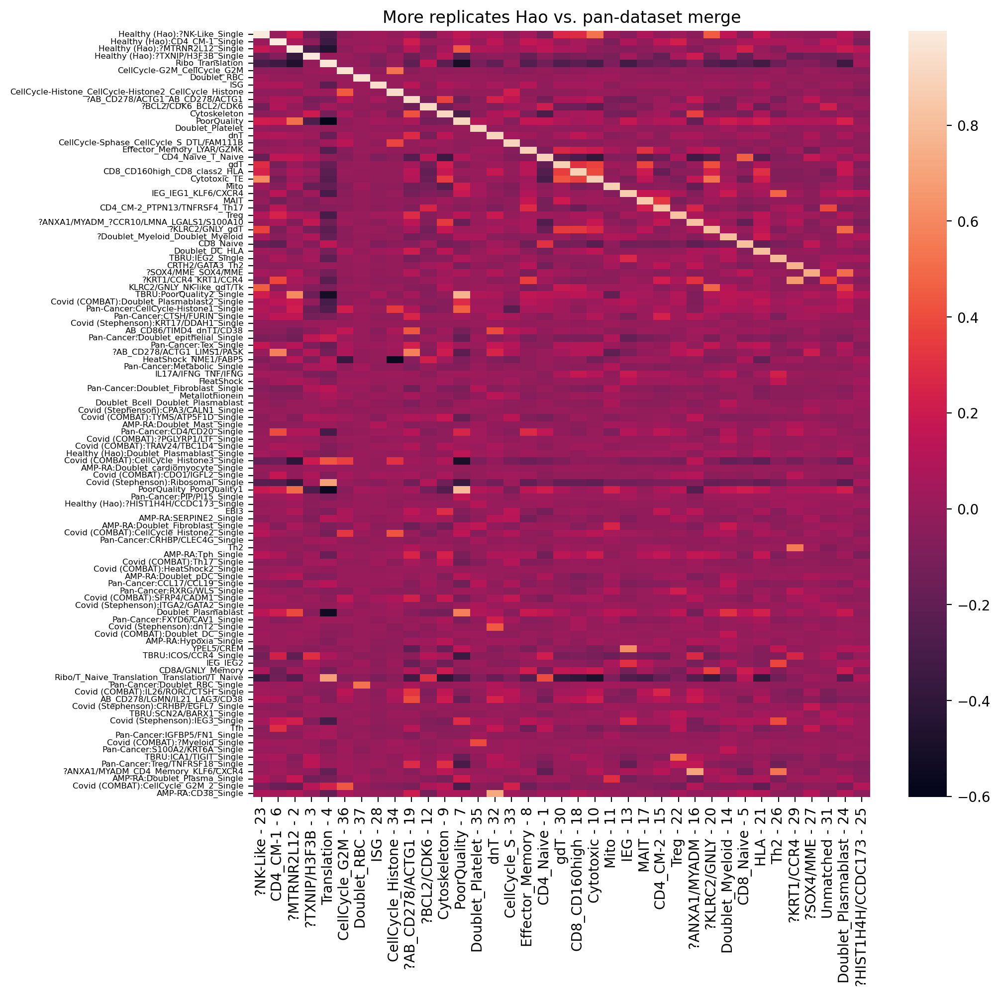

In [44]:
specfn = '/data/srlab1/mcurtis/GSK/tcell_proliferation/TCellAnnotator/cache/gene_scores_grouped.pairwiseCorr.Z_HVGunion.2022.08.19.txt'
consensus_spec = pd.read_csv(specfn, sep='\t', index_col=0).T
overlap = list(set(spectra_scores_lab.index).intersection(consensus_spec.index))

(mapping, R) = get_assignment(consensus_spec.loc[overlap,:], spectra_scores_lab.loc[overlap,:])
mapping33 = pd.Series(mapping).sort_index()
mapping33_maxR = pd.Series({i:R.at[mapping33[i], i] for i in mapping33.keys()})
display((mapping33_maxR>.6).value_counts())

colorder = mapping33_maxR.sort_values(ascending=False).index
roworder = [mapping33[x] for x in colorder]
roworder +=  list(set(R.index) - set(roworder))
(fig,ax) = plt.subplots(1,1, figsize=(10,10), dpi=200)
sns.heatmap(R.loc[roworder, colorder], ax=ax,  yticklabels=True)
_ = ax.set_yticklabels(roworder, fontsize=6)
ax.set_title('More replicates Hao vs. pan-dataset merge')


True     34
False     3
dtype: int64

Text(0.5, 1.0, 'learn with ADT vs. no ADT')

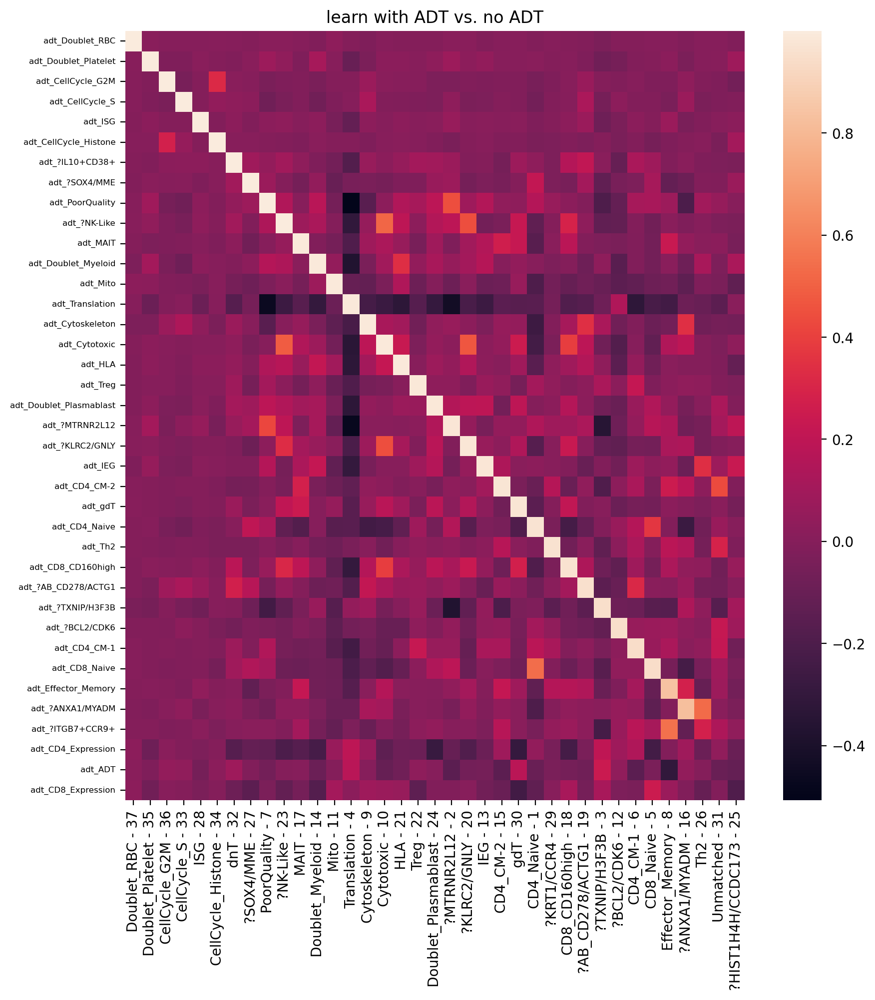

In [45]:
with_adt = pd.read_csv('../../Data/HaoEtAl_PBMC/T_learnHarmonyBoth_RefitBoth_20221022/T_learnHarmonyBoth_RefitBoth_20221022.gene_spectra_score.k_38.dt_0_2.labeled.txt', sep='\t',index_col=0)
with_adt.columns = ['adt_' + x for x in with_adt.columns]

mapping, R = get_assignment(with_adt, spectra_scores_lab)
mapping_reverse = {mapping[x]:x for x in mapping.keys()}

overlap = list(set(spectra_scores_lab.index).intersection(with_adt.index))

(mapping, R) = get_assignment(with_adt.loc[overlap,:], spectra_scores_lab.loc[overlap,:])
mapping33 = pd.Series(mapping).sort_index()
mapping33_maxR = pd.Series({i:R.at[mapping33[i], i] for i in mapping33.keys()})
display((mapping33_maxR>.6).value_counts())

colorder = mapping33_maxR.sort_values(ascending=False).index
roworder = [mapping33[x] for x in colorder]
roworder +=  list(set(R.index) - set(roworder))
(fig,ax) = plt.subplots(1,1, figsize=(10,10), dpi=200)
sns.heatmap(R.loc[roworder, colorder], ax=ax,  yticklabels=True)
_ = ax.set_yticklabels(roworder, fontsize=6)
ax.set_title('learn with ADT vs. no ADT')

In [46]:
top_genes.head(20).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
CD4_Naive - 1,IL6ST,CCR7,FHIT,SELL,PIK3IP1,SATB1,LEF1,FOXP1,TCF7,FYB1,AB_GP130,TRABD2A,NOSIP,CHRM3-AS2,ANKRD55,LINC00861,ADTRP,AB_CD109,TSHZ2,TTN
?MTRNR2L12 - 2,MTRNR2L8,MTRNR2L12,CWC22,CHD4,KIAA1551,TRIP11,AB_CD307e,AB_CD93,NOC3L,GIMAP7,SLFN5,MALAT1,LEO1,HSPH1,RPAP3,TOP1,PLCG2,DDX52,GOLGA4,GPATCH11
?TXNIP/H3F3B - 3,TXNIP,BTG1,H3F3B,MALAT1,H1FX,RPS4Y1,PTMA,TSC22D3,B2M,KLF2,RPL36AL,TMSB4X,CXCR4,TRBC2,SRSF5,ITM2B,TMSB10,HLA-A,TRAC,EIF1
Translation - 4,RPS18,RPS8,RPS6,RPS12,RPS4X,RPL3,RPS3,EEF1A1,RPS27A,RPL13,RPS3A,RPLP1,RPS14,TPT1,RPL10,RPS15A,EEF1B2,RPL21,RPS2,RPL34
CD8_Naive - 5,AB_CD8,LINC02446,AB_CD8a,CD8B,AB_CD73,NELL2,S100B,AB_CD55,CARS,AB_CD45RA,PASK,ACTN1,AB_CD31,PDE3B,AB_CD314,OXNAD1,YBX3,CD8A,CCR7,CLEC11A
CD4_CM-1 - 6,LIMS1,PASK,GPR183,AP3M2,FYB1,AB_CD45RO,TSHZ2,ARID5B,MAF,ST8SIA1,ITM2A,TBC1D4,CD84,AQP3,CORO1B,LINC00402,EPHA4,TP53INP1,TRADD,AB_CD278
PoorQuality - 7,MALAT1,MACF1,UTRN,SYNE2,GOLGB1,GOLGA4,SYNE1,SMCHD1,RNF213,AHNAK,MYH9,ANKRD36C,HNRNPU,TUT7,SLFN12L,HNRNPA2B1,ITGA4,KIAA1109,NKTR,NEAT1
Effector_Memory - 8,IL7R,LYAR,ITGA1,PTGER2,CXCR3,CYB561,GBP5,IGFBP3,IFNG-AS1,CCR9,PARP8,PRDM1,NSG1,ANTXR2,GPR171,AB_CD49a,ITGA4,AB_CD2,AB_CD127,SAMSN1
Cytoskeleton - 9,ACTB,PFN1,ACTG1,CFL1,LCP1,CALR,HCST,CLIC1,ARPC2,TMSB4X,CORO1A,MYL6,TPM4,MYL12A,SH3BGRL3,S100A4,IFITM2,CALM1,PDIA3,HSPA5
Cytotoxic - 10,FGFBP2,GZMH,PROK2,NKG7,GZMB,EFHD2,CST7,LINC02384,C1orf21,ZEB2,PRSS23,TGFBR3,ADGRG1,ASCL2,AB_CD271,ITGB1,CX3CR1,CCL5,CD8A,PLEK


In [47]:
specfn = '/data/srlab1/dk718/Tcell_cNMF_Comparison/Data/HaoEtAl_PBMC/T_learnHarmonyRNA_RefitBoth_20221022/T_learnHarmonyRNA_RefitBoth_20221022.gene_spectra_score.k_35.dt_0_2.labeled.txt'
spec35 = pd.read_csv(specfn, sep='\t', index_col=0)

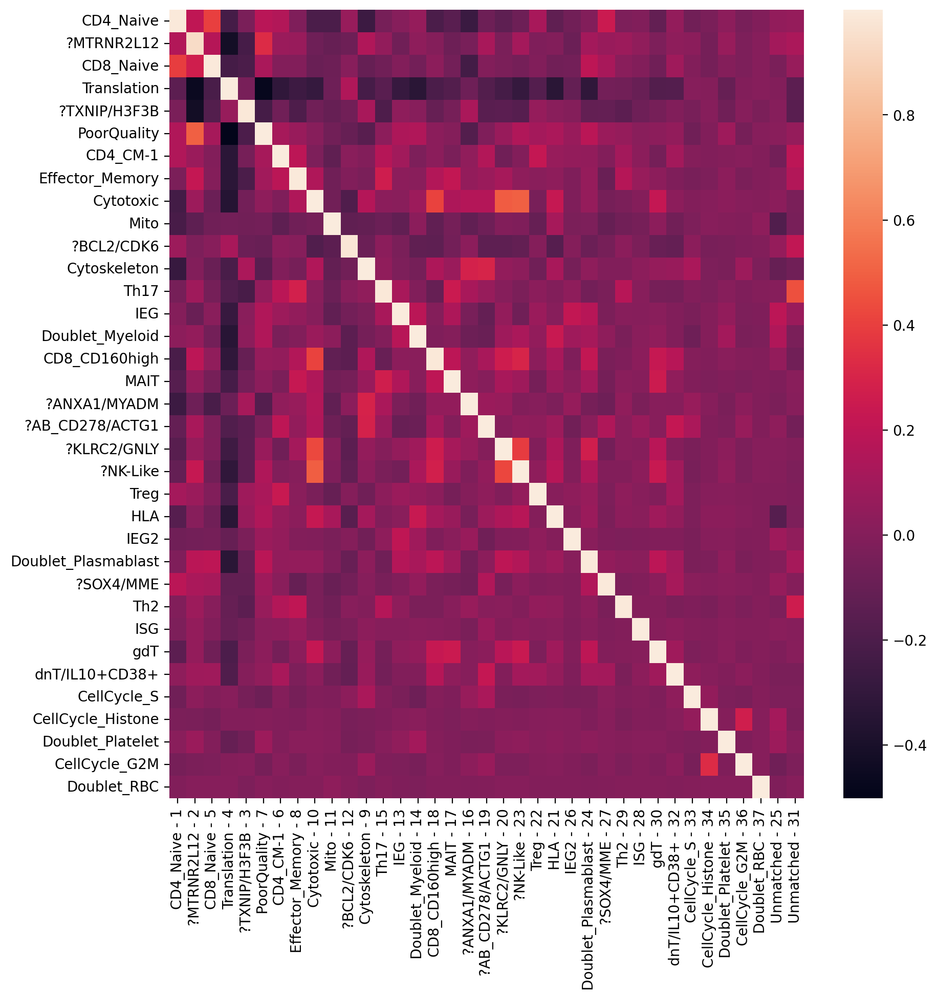

In [48]:
mapping, R = get_assignment(spec35, spectra_scores)
mapping_reverse = {mapping[x]:x for x in mapping.keys()}
orig = R.columns
new = []
fullnew = []
for x in R.columns:
    if x in mapping:
        new.append(mapping[x])
        fullnew.append(mapping[x] + ' - ' + str(x))
    else:
        new.append(x)
        fullnew.append('Unmatched' + ' - ' + str(x))
        
new2full_map = dict(zip(new, fullnew))
new_full = [new2full_map[x] for x in new]

R.columns = new
unmatched = list(set(R.columns) - set(R.index))
R_reordered = pd.concat([R.loc[:, R.index], R.loc[:, unmatched]], axis=1)
R_reordered.columns = [new2full_map[x] for x in R_reordered.columns]
fig,ax = plt.subplots(1,1, figsize=(10,10), dpi=200)
sns.heatmap(R_reordered, ax=ax)
top_genes.columns = [new2full_map[x] for x in new]


In [51]:
top_genes.head(20).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
CD4_Naive - 1,IL6ST,CCR7,FHIT,SELL,PIK3IP1,SATB1,LEF1,FOXP1,TCF7,FYB1,AB_GP130,TRABD2A,NOSIP,CHRM3-AS2,ANKRD55,LINC00861,ADTRP,AB_CD109,TSHZ2,TTN
?MTRNR2L12 - 2,MTRNR2L8,MTRNR2L12,CWC22,CHD4,KIAA1551,TRIP11,AB_CD307e,AB_CD93,NOC3L,GIMAP7,SLFN5,MALAT1,LEO1,HSPH1,RPAP3,TOP1,PLCG2,DDX52,GOLGA4,GPATCH11
?TXNIP/H3F3B - 3,TXNIP,BTG1,H3F3B,MALAT1,H1FX,RPS4Y1,PTMA,TSC22D3,B2M,KLF2,RPL36AL,TMSB4X,CXCR4,TRBC2,SRSF5,ITM2B,TMSB10,HLA-A,TRAC,EIF1
Translation - 4,RPS18,RPS8,RPS6,RPS12,RPS4X,RPL3,RPS3,EEF1A1,RPS27A,RPL13,RPS3A,RPLP1,RPS14,TPT1,RPL10,RPS15A,EEF1B2,RPL21,RPS2,RPL34
CD8_Naive - 5,AB_CD8,LINC02446,AB_CD8a,CD8B,AB_CD73,NELL2,S100B,AB_CD55,CARS,AB_CD45RA,PASK,ACTN1,AB_CD31,PDE3B,AB_CD314,OXNAD1,YBX3,CD8A,CCR7,CLEC11A
CD4_CM-1 - 6,LIMS1,PASK,GPR183,AP3M2,FYB1,AB_CD45RO,TSHZ2,ARID5B,MAF,ST8SIA1,ITM2A,TBC1D4,CD84,AQP3,CORO1B,LINC00402,EPHA4,TP53INP1,TRADD,AB_CD278
PoorQuality - 7,MALAT1,MACF1,UTRN,SYNE2,GOLGB1,GOLGA4,SYNE1,SMCHD1,RNF213,AHNAK,MYH9,ANKRD36C,HNRNPU,TUT7,SLFN12L,HNRNPA2B1,ITGA4,KIAA1109,NKTR,NEAT1
Effector_Memory - 8,IL7R,LYAR,ITGA1,PTGER2,CXCR3,CYB561,GBP5,IGFBP3,IFNG-AS1,CCR9,PARP8,PRDM1,NSG1,ANTXR2,GPR171,AB_CD49a,ITGA4,AB_CD2,AB_CD127,SAMSN1
Cytoskeleton - 9,ACTB,PFN1,ACTG1,CFL1,LCP1,CALR,HCST,CLIC1,ARPC2,TMSB4X,CORO1A,MYL6,TPM4,MYL12A,SH3BGRL3,S100A4,IFITM2,CALM1,PDIA3,HSPA5
Cytotoxic - 10,FGFBP2,GZMH,PROK2,NKG7,GZMB,EFHD2,CST7,LINC02384,C1orf21,ZEB2,PRSS23,TGFBR3,ADGRG1,ASCL2,AB_CD271,ITGB1,CX3CR1,CCL5,CD8A,PLEK


# K=35

/PHShome/dk718/miniforge3/envs/cnmf_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


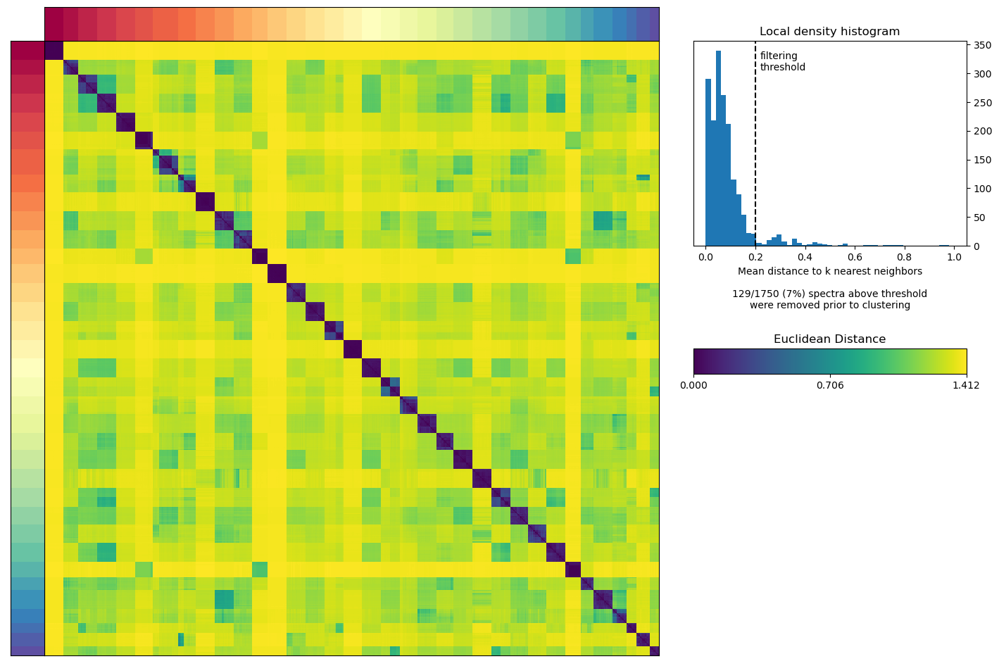

In [60]:
cnmf_obj.consensus(k=35, density_threshold=0.2)

In [5]:
(usage, spectra_scores, spectra_tpm, top_genes) = cnmf_obj.load_results(K=35, density_threshold=0.2)
top_genes.columns = ['GEP%d' % x for x in top_genes.columns]

In [6]:
top_genes.head(20).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
GEP1,IL6ST,CCR7,FHIT,SELL,PIK3IP1,SATB1,LEF1,FOXP1,TCF7,FYB1,AB_GP130,LINC00861,NOSIP,TRABD2A,CHRM3-AS2,ANKRD55,AB_CD109,ADTRP,TSHZ2,ETS1
GEP2,HRH2,TCEA3,CHD4,LIMA1,C1orf162,MTRNR2L12,AB_CD307e,KIAA1551,EPHA1-AS1,MTRNR2L8,KCNQ1OT1,ORAI2,TRAC,SLFN5,PLP2,ACTB,PCSK1N,CWC22,NOC3L,TRIP11
GEP3,AB_CD8,LINC02446,AB_CD8a,CD8B,AB_CD73,NELL2,S100B,AB_CD55,CARS,AB_CD45RA,PASK,ACTN1,AB_CD314,AB_CD31,PDE3B,YBX3,CCR7,OXNAD1,CD8A,NRCAM
GEP4,RPS18,RPS8,RPS6,RPS4X,RPL3,RPS12,RPS3,EEF1A1,RPL13,RPS27A,RPLP1,RPS3A,TPT1,RPS14,RPL10,RPS15A,EEF1B2,RPS2,RPL21,RPL34
GEP5,TXNIP,H3F3B,BTG1,H1FX,PTMA,RPS4Y1,MALAT1,TSC22D3,KLF2,TMSB4X,TMSB10,RPL36AL,EIF1,CXCR4,B2M,FTL,FAU,ITM2B,SRSF5,TRBC2
GEP6,MALAT1,MACF1,UTRN,GOLGB1,SYNE2,GOLGA4,SYNE1,SMCHD1,ANKRD36C,RNF213,HNRNPU,MYH9,AHNAK,TUT7,HNRNPA2B1,NCL,KIAA1109,BDP1,ITGA4,NKTR
GEP7,LIMS1,PASK,GPR183,AP3M2,FYB1,ARID5B,AB_CD45RO,TSHZ2,ST8SIA1,MAF,CD84,ITM2A,EPHA4,CORO1B,TRADD,LINC00402,TBC1D4,AQP3,ST6GALNAC1,TP53INP1
GEP8,IL7R,LYAR,PTGER2,ITGA1,CXCR3,GBP5,IFNG-AS1,CYB561,IGFBP3,CCR9,ANTXR2,PRDM1,NSG1,PARP8,GPR171,ITGA4,AB_CD49a,CD2,SAMSN1,AB_CD2
GEP9,FGFBP2,GZMH,PROK2,NKG7,GZMB,EFHD2,CST7,C1orf21,LINC02384,PRSS23,ZEB2,TGFBR3,ITGB1,ASCL2,ADGRG1,AB_CD271,CCL5,PLEK,RAP1B,CX3CR1
GEP10,MT-ATP6,MT-CYB,MT-CO2,MT-ND4,MT-ND3,MT-CO3,MT-ND2,MT-ND1,MT-ND5,MT-CO1,MT-ND4L,MT-ATP8,MT-ND6,MTRNR2L12,AB_CD45-2,RPL36A,AB_CD314,HLA-F,CYBA,LUC7L3


In [7]:
outfn = '/data/srlab1/dk718/Tcell_cNMF_Comparison/Data/HaoEtAl_PBMC/T_learnHarmonyRNA_RefitBoth/T_learnHarmonyRNA_RefitBoth.gene_spectra_score.k_36.dt_0_2.labeled.txt'
orig_spectra_labeled = pd.read_csv(outfn, sep='\t', index_col=0)
orig_spectra_labeled.head()

,CD4_Naive,?MTRNR2L12,?TXNIP/H3F3B,Translation,CD8_Naive,PoorQuality,CD4_CM-1,Cytotoxic,Effector_Memory,Cytoskeleton,...,HLA,dnT,CellCycle_S,Doublet_Platelet,CellCycle_G2M,CellCycle_Histone,Th2,Doublet_Plasmablast,?HIST1H4H/CCDC173,Doublet_RBC
LINC00115,-0.000047,0.000107,-0.000113,-0.000556,0.000120,0.000258,1.129847e-04,0.000007,0.000023,-0.000065,...,-0.000057,0.000299,-0.000081,-0.000257,-0.000004,0.000114,-0.000215,-0.000137,-0.000427,0.000133
FAM41C,0.000081,0.000308,-0.000463,-0.000421,0.000094,-0.000168,7.271318e-07,0.000104,0.000415,-0.000323,...,-0.000263,-0.000071,0.000054,0.000128,0.000209,-0.000247,-0.000208,0.000100,-0.000070,-0.000055
NOC2L,0.000100,0.000531,-0.000841,-0.001774,0.000335,0.000487,3.913925e-05,-0.000020,-0.000097,-0.000156,...,0.000913,-0.000070,0.000116,-0.000401,-0.000025,-0.000175,0.000046,-0.000336,-0.000250,0.000028
KLHL17,-0.000102,0.000086,0.000049,-0.000572,0.000047,0.000212,2.026965e-04,0.000032,0.000089,0.000217,...,0.000366,0.000208,-0.000172,0.000032,-0.000016,0.000371,0.000065,-0.000046,0.000400,-0.000326
PLEKHN1,-0.000148,-0.000053,-0.000238,-0.000241,-0.000154,0.000054,-9.401168e-05,-0.000171,0.000597,0.000219,...,-0.000084,0.000171,-0.000087,-0.000152,-0.000079,0.000033,-0.000154,0.000057,-0.000520,-0.000221


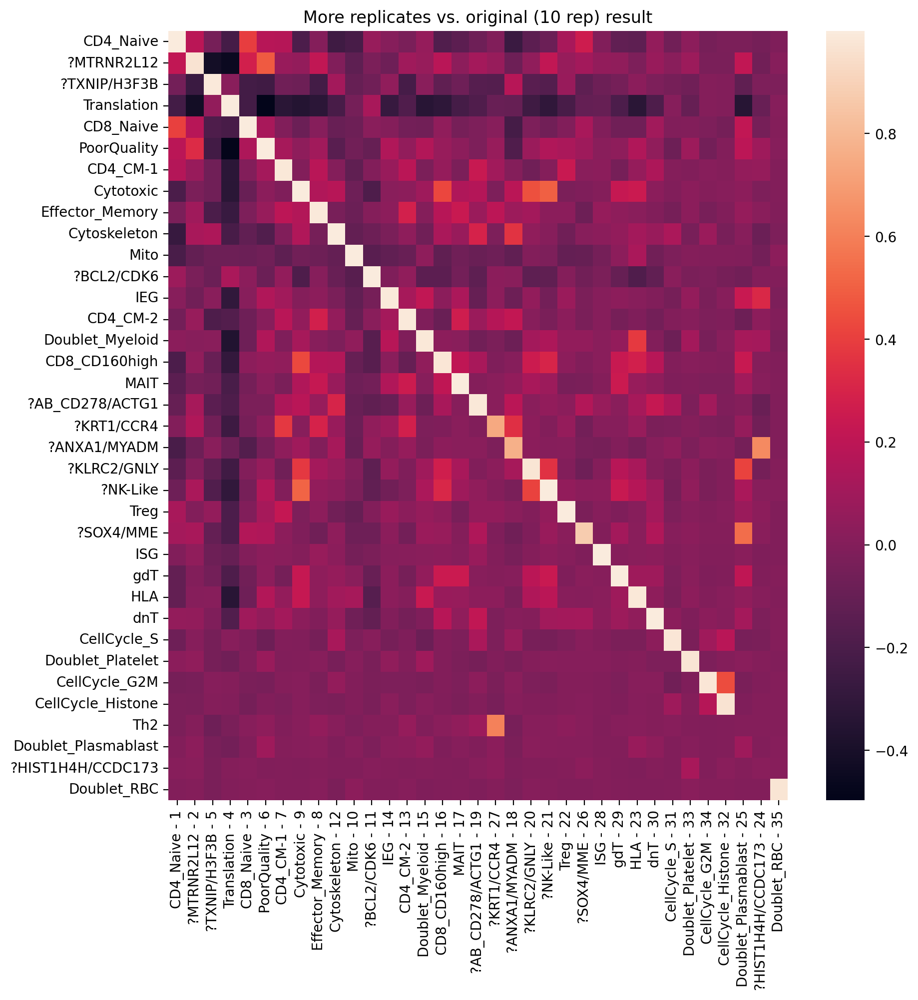

In [8]:
mapping_reverse, R = get_assignment(spectra_scores, orig_spectra_labeled)
R = R.T


mapping = {mapping_reverse[x]:x for x in mapping_reverse.keys()}

orig = R.columns
new = []
fullnew = []
for x in R.columns:
    if x in mapping:
        new.append(mapping[x])
        fullnew.append(mapping[x] + ' - ' + str(x))
    else:
        new.append(x)
        fullnew.append('Unmatched' + ' - ' + str(x))
        
new2full_map = dict(zip(new, fullnew))
new_full = [new2full_map[x] for x in new]

R.columns = new
unmatched = list(set(R.columns) - set(R.index))
matched = [x for x in R.index if x in new]
R_reordered = pd.concat([R.loc[:, matched], R.loc[:, unmatched]], axis=1)
R_reordered.columns = [new2full_map[x] for x in R_reordered.columns]
fig,ax = plt.subplots(1,1, figsize=(10,10), dpi=200)
sns.heatmap(R_reordered, ax=ax)
ax.set_title('More replicates vs. original (10 rep) result')

spectra_scores_lab = spectra_scores.copy()
spectra_scores_lab.columns = [new2full_map[x] for x in new]
spectra_scores_lab = spectra_scores_lab.loc[:, R_reordered.columns]

True     34
False     1
dtype: int64

Text(0.5, 1.0, 'More replicates Hao vs. pan-dataset merge')

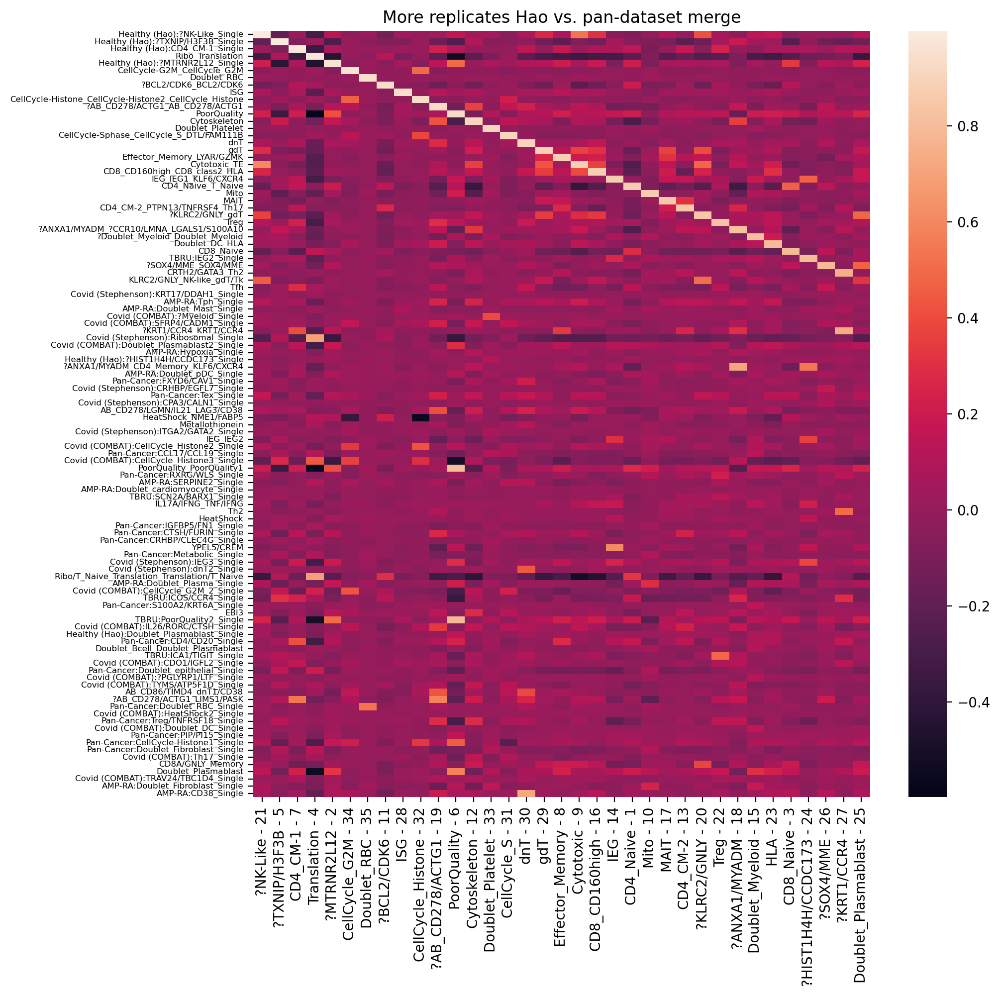

In [9]:
specfn = '/data/srlab1/mcurtis/GSK/tcell_proliferation/TCellAnnotator/cache/gene_scores_grouped.pairwiseCorr.Z_HVGunion.2022.08.19.txt'
consensus_spec = pd.read_csv(specfn, sep='\t', index_col=0).T
overlap = list(set(spectra_scores_lab.index).intersection(consensus_spec.index))

(mapping, R) = get_assignment(consensus_spec.loc[overlap,:], spectra_scores_lab.loc[overlap,:])
mapping33 = pd.Series(mapping).sort_index()
mapping33_maxR = pd.Series({i:R.at[mapping33[i], i] for i in mapping33.keys()})
display((mapping33_maxR>.6).value_counts())

colorder = mapping33_maxR.sort_values(ascending=False).index
roworder = [mapping33[x] for x in colorder]
roworder +=  list(set(R.index) - set(roworder))
(fig,ax) = plt.subplots(1,1, figsize=(10,10), dpi=200)
sns.heatmap(R.loc[roworder, colorder], ax=ax,  yticklabels=True)
_ = ax.set_yticklabels(roworder, fontsize=6)
ax.set_title('More replicates Hao vs. pan-dataset merge')


True     34
False     1
dtype: int64

Text(0.5, 1.0, 'learn with ADT vs. no ADT')

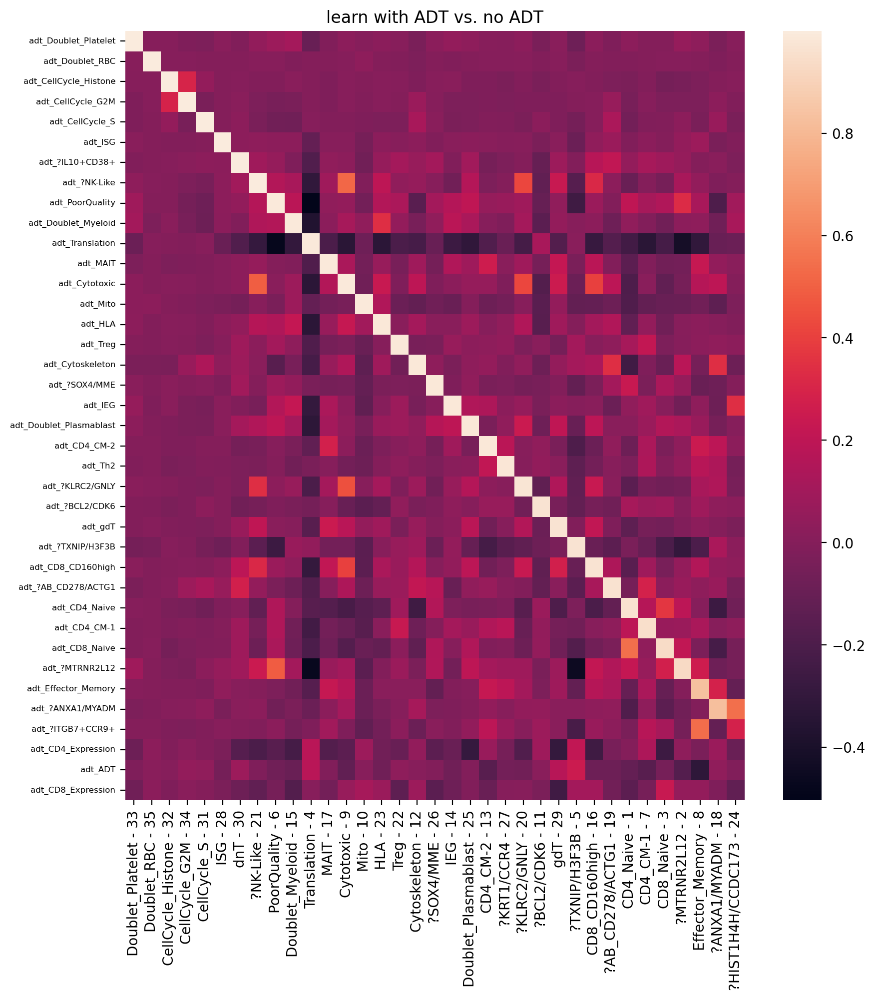

In [10]:
with_adt = pd.read_csv('../../Data/HaoEtAl_PBMC/T_learnHarmonyBoth_RefitBoth_20221022/T_learnHarmonyBoth_RefitBoth_20221022.gene_spectra_score.k_38.dt_0_2.labeled.txt', sep='\t',index_col=0)
with_adt.columns = ['adt_' + x for x in with_adt.columns]

mapping, R = get_assignment(with_adt, spectra_scores_lab)
mapping_reverse = {mapping[x]:x for x in mapping.keys()}

overlap = list(set(spectra_scores_lab.index).intersection(with_adt.index))

(mapping, R) = get_assignment(with_adt.loc[overlap,:], spectra_scores_lab.loc[overlap,:])
mapping33 = pd.Series(mapping).sort_index()
mapping33_maxR = pd.Series({i:R.at[mapping33[i], i] for i in mapping33.keys()})
display((mapping33_maxR>.6).value_counts())

colorder = mapping33_maxR.sort_values(ascending=False).index
roworder = [mapping33[x] for x in colorder]
roworder +=  list(set(R.index) - set(roworder))
(fig,ax) = plt.subplots(1,1, figsize=(10,10), dpi=200)
sns.heatmap(R.loc[roworder, colorder], ax=ax,  yticklabels=True)
_ = ax.set_yticklabels(roworder, fontsize=6)
ax.set_title('learn with ADT vs. no ADT')

In [11]:
spectra_scores_lab.loc['CXCR3', :].sort_values(ascending=False).head(15)

Effector_Memory - 8         0.005811
?AB_CD278/ACTG1 - 19        0.003846
Doublet_Plasmablast - 25    0.003441
CellCycle_G2M - 34          0.001744
?KLRC2/GNLY - 20            0.001060
CellCycle_S - 31            0.001020
Cytoskeleton - 12           0.000772
Doublet_RBC - 35            0.000754
?ANXA1/MYADM - 18           0.000694
?MTRNR2L12 - 2              0.000500
CD8_CD160high - 16          0.000131
gdT - 29                    0.000106
CD8_Naive - 3               0.000059
HLA - 23                    0.000011
CellCycle_Histone - 32     -0.000125
Name: CXCR3, dtype: float64

In [12]:
spectra_scores_lab.loc['CCR5', :].sort_values(ascending=False).head(15)

?AB_CD278/ACTG1 - 19      0.003910
MAIT - 17                 0.002045
HLA - 23                  0.001785
gdT - 29                  0.000951
PoorQuality - 6           0.000548
CD8_CD160high - 16        0.000504
CellCycle_G2M - 34        0.000492
Cytoskeleton - 12         0.000395
?BCL2/CDK6 - 11           0.000283
Effector_Memory - 8       0.000267
?MTRNR2L12 - 2            0.000155
CellCycle_Histone - 32    0.000077
CellCycle_S - 31          0.000058
Mito - 10                 0.000044
Doublet_Platelet - 33    -0.000016
Name: CCR5, dtype: float64

In [13]:
spectra_scores_lab.loc['CCR3', :].sort_values(ascending=False).head(15)

?KRT1/CCR4 - 27             0.001962
?AB_CD278/ACTG1 - 19        0.001927
Treg - 22                   0.000950
CellCycle_S - 31            0.000785
Doublet_Platelet - 33       0.000691
?ANXA1/MYADM - 18           0.000532
ISG - 28                    0.000443
?KLRC2/GNLY - 20            0.000379
HLA - 23                    0.000228
MAIT - 17                   0.000155
CD8_Naive - 3               0.000094
CD4_Naive - 1               0.000093
Effector_Memory - 8         0.000077
CellCycle_Histone - 32      0.000074
Doublet_Plasmablast - 25    0.000059
Name: CCR3, dtype: float64

In [14]:
spectra_scores_lab.loc['CCR4', :].sort_values(ascending=False).head(15)

?KRT1/CCR4 - 27           0.008295
CD4_CM-1 - 7              0.003693
?ANXA1/MYADM - 18         0.001179
IEG - 14                  0.001080
Treg - 22                 0.000860
Doublet_RBC - 35          0.000345
CD4_CM-2 - 13             0.000311
HLA - 23                  0.000297
?AB_CD278/ACTG1 - 19      0.000216
?MTRNR2L12 - 2            0.000183
CD8_CD160high - 16        0.000117
Cytoskeleton - 12         0.000116
CellCycle_Histone - 32    0.000083
CellCycle_G2M - 34        0.000060
Doublet_Platelet - 33     0.000010
Name: CCR4, dtype: float64

In [15]:
spectra_scores_lab.loc['CCR8', :].sort_values(ascending=False).head(15)

?KRT1/CCR4 - 27             0.001524
?ANXA1/MYADM - 18           0.001048
Doublet_Platelet - 33       0.000615
?AB_CD278/ACTG1 - 19        0.000492
?MTRNR2L12 - 2              0.000255
Treg - 22                   0.000176
Mito - 10                   0.000066
Doublet_Myeloid - 15        0.000053
CellCycle_G2M - 34          0.000031
CD8_Naive - 3               0.000025
ISG - 28                   -0.000002
?NK-Like - 21              -0.000003
Doublet_Plasmablast - 25   -0.000003
?KLRC2/GNLY - 20           -0.000014
CD4_Naive - 1              -0.000016
Name: CCR8, dtype: float64

In [16]:
spectra_scores_lab.loc['CCR6', :].sort_values(ascending=False).head(15)

CD4_CM-2 - 13             0.007918
MAIT - 17                 0.002379
CD4_CM-1 - 7              0.001556
IEG - 14                  0.001178
Doublet_Platelet - 33     0.000686
PoorQuality - 6           0.000377
?MTRNR2L12 - 2            0.000171
Treg - 22                 0.000151
?SOX4/MME - 26           -0.000030
?HIST1H4H/CCDC173 - 24   -0.000030
Doublet_Myeloid - 15     -0.000043
CellCycle_Histone - 32   -0.000046
CellCycle_S - 31         -0.000063
CellCycle_G2M - 34       -0.000082
?NK-Like - 21            -0.000124
Name: CCR6, dtype: float64

In [17]:
spectra_scores_lab.loc['AB_CD62P', :].sort_values(ascending=False).head(25)

gdT - 29                    0.007325
Doublet_Platelet - 33       0.006954
Doublet_Myeloid - 15        0.003886
dnT - 30                    0.002340
?NK-Like - 21               0.002236
?HIST1H4H/CCDC173 - 24      0.001792
Doublet_Plasmablast - 25    0.001746
Treg - 22                   0.001528
PoorQuality - 6             0.001411
?SOX4/MME - 26              0.001306
CellCycle_S - 31            0.000871
MAIT - 17                   0.000792
CellCycle_G2M - 34          0.000756
?ANXA1/MYADM - 18           0.000720
IEG - 14                    0.000669
?AB_CD278/ACTG1 - 19        0.000633
?KLRC2/GNLY - 20            0.000633
?MTRNR2L12 - 2              0.000458
CD8_CD160high - 16          0.000377
CD8_Naive - 3               0.000194
?KRT1/CCR4 - 27             0.000150
CellCycle_Histone - 32      0.000032
Cytotoxic - 9               0.000025
CD4_Naive - 1              -0.000021
ISG - 28                   -0.000207
Name: AB_CD62P, dtype: float64

In [18]:
[x for x in spectra_scores_lab.index if 'IL17' in x]

['IL17RE', 'IL17RC', 'IL17RA', 'IL17C', 'IL17RB', 'IL17D']

In [19]:
spectra_scores_lab.loc['IL17D', :].sort_values(ascending=False).head(15)

?HIST1H4H/CCDC173 - 24      0.001020
?NK-Like - 21               0.000371
Mito - 10                   0.000289
CD8_CD160high - 16          0.000287
?MTRNR2L12 - 2              0.000147
?AB_CD278/ACTG1 - 19        0.000122
Doublet_Myeloid - 15        0.000117
?BCL2/CDK6 - 11             0.000083
Doublet_Plasmablast - 25    0.000063
IEG - 14                    0.000048
CellCycle_S - 31            0.000020
?SOX4/MME - 26              0.000020
gdT - 29                    0.000017
CellCycle_G2M - 34          0.000012
CD4_CM-1 - 7               -0.000008
Name: IL17D, dtype: float64

In [20]:
spectra_scores_lab.loc['RORC', :].sort_values(ascending=False)

MAIT - 17                   3.317546e-03
CD4_CM-2 - 13               3.147384e-03
?ANXA1/MYADM - 18           9.894867e-04
Doublet_RBC - 35            5.024848e-04
?MTRNR2L12 - 2              2.936425e-04
?AB_CD278/ACTG1 - 19        2.046734e-04
PoorQuality - 6             1.555617e-04
Mito - 10                   6.009635e-05
ISG - 28                    3.268772e-05
?SOX4/MME - 26              7.048416e-06
CellCycle_G2M - 34          5.178015e-08
CellCycle_Histone - 32     -2.028455e-05
Cytoskeleton - 12          -2.916233e-05
CellCycle_S - 31           -4.922236e-05
Doublet_Plasmablast - 25   -7.196397e-05
HLA - 23                   -1.039019e-04
CD8_CD160high - 16         -1.335513e-04
CD8_Naive - 3              -1.461443e-04
?NK-Like - 21              -1.684014e-04
CD4_Naive - 1              -1.788827e-04
Doublet_Platelet - 33      -2.052958e-04
CD4_CM-1 - 7               -2.331000e-04
Doublet_Myeloid - 15       -2.405303e-04
?KLRC2/GNLY - 20           -2.444408e-04
Cytotoxic - 9   

In [21]:
spectra_scores_lab.loc['IFNG', :].sort_values(ascending=False)

?HIST1H4H/CCDC173 - 24      0.008503
CD8_CD160high - 16          0.001826
?AB_CD278/ACTG1 - 19        0.001526
?NK-Like - 21               0.001254
Cytotoxic - 9               0.001081
CellCycle_G2M - 34          0.000667
Cytoskeleton - 12           0.000653
HLA - 23                    0.000547
CellCycle_S - 31            0.000370
?MTRNR2L12 - 2              0.000037
?BCL2/CDK6 - 11             0.000030
?TXNIP/H3F3B - 5           -0.000158
?ANXA1/MYADM - 18          -0.000163
CD8_Naive - 3              -0.000198
Doublet_RBC - 35           -0.000241
Effector_Memory - 8        -0.000241
?SOX4/MME - 26             -0.000242
CD4_Naive - 1              -0.000245
CD4_CM-1 - 7               -0.000257
PoorQuality - 6            -0.000307
MAIT - 17                  -0.000321
ISG - 28                   -0.000338
Doublet_Platelet - 33      -0.000368
?KLRC2/GNLY - 20           -0.000380
CellCycle_Histone - 32     -0.000384
IEG - 14                   -0.000403
Doublet_Myeloid - 15       -0.000456
?

In [173]:
spectra_scores_lab.loc['CCR5', :].sort_values(ascending=False)

?AB_CD278/ACTG1        0.003910
MAIT                   0.002045
HLA                    0.001785
gdT                    0.000951
PoorQuality            0.000548
CD8_CD160high          0.000504
CellCycle_G2M          0.000492
Cytoskeleton           0.000395
?BCL2/CDK6             0.000283
Effector_Memory        0.000267
?MTRNR2L12             0.000155
CellCycle_Histone      0.000077
CellCycle_S            0.000058
Mito                   0.000044
Doublet_Platelet      -0.000016
?TXNIP/H3F3B          -0.000034
Doublet_RBC           -0.000050
?KLRC2/GNLY           -0.000104
Th2                   -0.000156
Doublet_Myeloid       -0.000243
Cytotoxic             -0.000254
IEG2                  -0.000284
CD4_Naive             -0.000327
Th17                  -0.000352
CD8_Naive             -0.000353
?ANXA1/MYADM          -0.000376
Doublet_Plasmablast   -0.000474
?SOX4/MME             -0.000499
ISG                   -0.000537
?NK-Like              -0.000625
dnT/IL10+CD38+        -0.000670
Treg    

In [170]:
spectra_scores_lab.loc['CXCR3', :].sort_values(ascending=False)

Effector_Memory        0.005811
?AB_CD278/ACTG1        0.003846
Doublet_Plasmablast    0.003441
CellCycle_G2M          0.001744
?KLRC2/GNLY            0.001060
CellCycle_S            0.001020
Cytoskeleton           0.000772
Doublet_RBC            0.000754
?ANXA1/MYADM           0.000694
?MTRNR2L12             0.000500
CD8_CD160high          0.000131
gdT                    0.000106
CD8_Naive              0.000059
HLA                    0.000011
CellCycle_Histone     -0.000125
?SOX4/MME             -0.000152
Doublet_Platelet      -0.000248
dnT/IL10+CD38+        -0.000357
Mito                  -0.000421
Doublet_Myeloid       -0.000431
?TXNIP/H3F3B          -0.000459
Cytotoxic             -0.000524
ISG                   -0.000539
CD4_CM-1              -0.000602
Treg                  -0.000621
CD4_Naive             -0.000684
MAIT                  -0.000692
Th17                  -0.000724
PoorQuality           -0.000777
?BCL2/CDK6            -0.000822
Th2                   -0.000858
?NK-Like

In [252]:
spectra_scores_lab.loc['TBX21', :].sort_values(ascending=False)

Cytotoxic              0.003094
?NK-Like               0.002844
?KLRC2/GNLY            0.002727
gdT                    0.001691
CD8_CD160high          0.001137
Doublet_Platelet       0.000922
Doublet_Plasmablast    0.000685
MAIT                   0.000325
Effector_Memory        0.000304
ISG                    0.000208
CellCycle_G2M          0.000202
?ANXA1/MYADM           0.000167
?MTRNR2L12             0.000164
PoorQuality           -0.000015
?AB_CD278/ACTG1       -0.000065
Cytoskeleton          -0.000111
IEG                   -0.000140
CellCycle_Histone     -0.000164
ADT                   -0.000219
?SOX4/MME             -0.000261
CellCycle_S           -0.000273
CD8_Naive             -0.000276
?BCL2/CDK6            -0.000316
?IL10+CD38+           -0.000318
CD4_CM-2              -0.000328
?ITGB7+CCR9+          -0.000361
Th2                   -0.000364
CD4_Expression        -0.000374
Treg                  -0.000423
CD4_CM-1              -0.000469
Mito                  -0.000470
Doublet_

In [256]:
spectra_scores_lab.loc['STAT4', :].sort_values(ascending=False)

PoorQuality            0.001893
IEG                    0.001560
gdT                    0.001313
CD8_CD160high          0.001130
Doublet_Myeloid        0.000960
Cytotoxic              0.000859
?MTRNR2L12             0.000763
Effector_Memory        0.000718
Mito                   0.000714
CD8_Naive              0.000598
MAIT                   0.000598
?NK-Like               0.000581
CD4_CM-2               0.000498
?ITGB7+CCR9+           0.000378
CD8_Expression         0.000341
Th2                    0.000247
?BCL2/CDK6             0.000073
CD4_Expression         0.000070
HLA                    0.000059
Doublet_Platelet      -0.000025
ISG                   -0.000041
CellCycle_Histone     -0.000043
CellCycle_G2M         -0.000080
CD4_Naive             -0.000107
?KLRC2/GNLY           -0.000108
CellCycle_S           -0.000187
?IL10+CD38+           -0.000234
Doublet_RBC           -0.000383
?AB_CD278/ACTG1       -0.000490
Cytoskeleton          -0.000549
Treg                  -0.000582
Doublet_

In [22]:
dict(zip(orig, fullnew))

{1: 'CD4_Naive - 1',
 2: '?MTRNR2L12 - 2',
 3: 'CD8_Naive - 3',
 4: 'Translation - 4',
 5: '?TXNIP/H3F3B - 5',
 6: 'PoorQuality - 6',
 7: 'CD4_CM-1 - 7',
 8: 'Effector_Memory - 8',
 9: 'Cytotoxic - 9',
 10: 'Mito - 10',
 11: '?BCL2/CDK6 - 11',
 12: 'Cytoskeleton - 12',
 13: 'CD4_CM-2 - 13',
 14: 'IEG - 14',
 15: 'Doublet_Myeloid - 15',
 16: 'CD8_CD160high - 16',
 17: 'MAIT - 17',
 18: '?ANXA1/MYADM - 18',
 19: '?AB_CD278/ACTG1 - 19',
 20: '?KLRC2/GNLY - 20',
 21: '?NK-Like - 21',
 22: 'Treg - 22',
 23: 'HLA - 23',
 24: '?HIST1H4H/CCDC173 - 24',
 25: 'Doublet_Plasmablast - 25',
 26: '?SOX4/MME - 26',
 27: '?KRT1/CCR4 - 27',
 28: 'ISG - 28',
 29: 'gdT - 29',
 30: 'dnT - 30',
 31: 'CellCycle_S - 31',
 32: 'CellCycle_Histone - 32',
 33: 'Doublet_Platelet - 33',
 34: 'CellCycle_G2M - 34',
 35: 'Doublet_RBC - 35'}

In [76]:
labels = {1: 'CD4_Naive',
 2: '?MTRNR2L12',
 3: 'CD8_Naive',
 4: 'Translation',
 5: '?TXNIP/H3F3B',
 6: 'PoorQuality',
 7: 'CD4_CM-1',
 8: 'Effector_Memory',
 9: 'Cytotoxic',
 10: 'Mito',
 11: '?BCL2/CDK6',
 12: 'Cytoskeleton',
 13: 'Th17',
 14: 'IEG',
 15: 'Doublet_Myeloid',
 16: 'CD8_CD160high',
 17: 'MAIT',
 18: '?ANXA1/MYADM',
 19: '?AB_CD278/ACTG1',
 20: '?KLRC2/GNLY',
 21: '?NK-Like',
 22: 'Treg',
 23: 'HLA',
 24: 'IEG2',
 25: 'Doublet_Plasmablast',
 26: '?SOX4/MME',
 27: 'Th2',
 28: 'ISG',
 29: 'gdT',
 30: 'dnT/IL10+CD38+',
 31: 'CellCycle_S',
 32: 'CellCycle_Histone',
 33: 'Doublet_Platelet',
 34: 'CellCycle_G2M',
 35: 'Doublet_RBC'}

In [78]:
(usage, spectra_scores, spectra_tpm, top_genes) = cnmf_obj.load_results(K=35, density_threshold=0.2, norm_usage=False)
top_genes = top_genes.rename(columns=labels)
top_genes.head(20).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
CD4_Naive,IL6ST,CCR7,FHIT,SELL,PIK3IP1,SATB1,LEF1,FOXP1,TCF7,FYB1,AB_GP130,LINC00861,NOSIP,TRABD2A,CHRM3-AS2,ANKRD55,AB_CD109,ADTRP,TSHZ2,ETS1
?MTRNR2L12,HRH2,TCEA3,CHD4,LIMA1,C1orf162,MTRNR2L12,AB_CD307e,KIAA1551,EPHA1-AS1,MTRNR2L8,KCNQ1OT1,ORAI2,TRAC,SLFN5,PLP2,ACTB,PCSK1N,CWC22,NOC3L,TRIP11
CD8_Naive,AB_CD8,LINC02446,AB_CD8a,CD8B,AB_CD73,NELL2,S100B,AB_CD55,CARS,AB_CD45RA,PASK,ACTN1,AB_CD314,AB_CD31,PDE3B,YBX3,CCR7,OXNAD1,CD8A,NRCAM
Translation,RPS18,RPS8,RPS6,RPS4X,RPL3,RPS12,RPS3,EEF1A1,RPL13,RPS27A,RPLP1,RPS3A,TPT1,RPS14,RPL10,RPS15A,EEF1B2,RPS2,RPL21,RPL34
?TXNIP/H3F3B,TXNIP,H3F3B,BTG1,H1FX,PTMA,RPS4Y1,MALAT1,TSC22D3,KLF2,TMSB4X,TMSB10,RPL36AL,EIF1,CXCR4,B2M,FTL,FAU,ITM2B,SRSF5,TRBC2
PoorQuality,MALAT1,MACF1,UTRN,GOLGB1,SYNE2,GOLGA4,SYNE1,SMCHD1,ANKRD36C,RNF213,HNRNPU,MYH9,AHNAK,TUT7,HNRNPA2B1,NCL,KIAA1109,BDP1,ITGA4,NKTR
CD4_CM-1,LIMS1,PASK,GPR183,AP3M2,FYB1,ARID5B,AB_CD45RO,TSHZ2,ST8SIA1,MAF,CD84,ITM2A,EPHA4,CORO1B,TRADD,LINC00402,TBC1D4,AQP3,ST6GALNAC1,TP53INP1
Effector_Memory,IL7R,LYAR,PTGER2,ITGA1,CXCR3,GBP5,IFNG-AS1,CYB561,IGFBP3,CCR9,ANTXR2,PRDM1,NSG1,PARP8,GPR171,ITGA4,AB_CD49a,CD2,SAMSN1,AB_CD2
Cytotoxic,FGFBP2,GZMH,PROK2,NKG7,GZMB,EFHD2,CST7,C1orf21,LINC02384,PRSS23,ZEB2,TGFBR3,ITGB1,ASCL2,ADGRG1,AB_CD271,CCL5,PLEK,RAP1B,CX3CR1
Mito,MT-ATP6,MT-CYB,MT-CO2,MT-ND4,MT-ND3,MT-CO3,MT-ND2,MT-ND1,MT-ND5,MT-CO1,MT-ND4L,MT-ATP8,MT-ND6,MTRNR2L12,AB_CD45-2,RPL36A,AB_CD314,HLA-F,CYBA,LUC7L3


In [79]:
spectra_scores.columns = [int(x) for x in spectra_scores.columns]
spectra_scores_lab = spectra_scores.rename(columns=labels)

spectra_tpm.columns = [int(x) for x in spectra_tpm.columns]
spectra_tpm_lab = spectra_tpm.rename(columns=labels)

usage.columns = [int(x) for x in usage.columns]
usage_lab = usage.rename(columns=labels)

In [80]:
specfn = cnmf_obj.paths['gene_spectra_score__txt'] % (35, '0_2')
specfn = os.path.abspath(specfn.replace('.txt', '.labeled.txt'))
print(specfn)
spectra_scores_lab.to_csv(specfn, sep='\t')

/data/srlab1/dk718/Tcell_cNMF_Comparison/Data/HaoEtAl_PBMC/T_learnHarmonyRNA_RefitBoth_20221022/T_learnHarmonyRNA_RefitBoth_20221022.gene_spectra_score.k_35.dt_0_2.labeled.txt


In [81]:
tpmfn = cnmf_obj.paths['gene_spectra_tpm__txt'] % (35, '0_2')
tpmfn = os.path.abspath(tpmfn.replace('.txt', '.labeled.txt'))
print(tpmfn)
spectra_tpm_lab.to_csv(tpmfn, sep='\t')

/data/srlab1/dk718/Tcell_cNMF_Comparison/Data/HaoEtAl_PBMC/T_learnHarmonyRNA_RefitBoth_20221022/T_learnHarmonyRNA_RefitBoth_20221022.gene_spectra_tpm.k_35.dt_0_2.labeled.txt


In [82]:
usagefn = cnmf_obj.paths['consensus_usages__txt'] % (35, '0_2')
usagefn = os.path.abspath(usagefn.replace('.txt', '.labeled.txt'))
print(usagefn)
usage_lab.to_csv(usagefn, sep='\t')

/data/srlab1/dk718/Tcell_cNMF_Comparison/Data/HaoEtAl_PBMC/T_learnHarmonyRNA_RefitBoth_20221022/T_learnHarmonyRNA_RefitBoth_20221022.usages.k_35.dt_0_2.consensus.labeled.txt


In [76]:
specfn = '/data/srlab1/dk718/Tcell_cNMF_Comparison/Data/HaoEtAl_PBMC/T_learnHarmonyRNA_RefitBoth_20221022/T_learnHarmonyRNA_RefitBoth_20221022.gene_spectra_score.k_35.dt_0_2.labeled.txt'
usagefn = '/data/srlab1/dk718/Tcell_cNMF_Comparison/Data/HaoEtAl_PBMC/T_learnHarmonyRNA_RefitBoth_20221022/T_learnHarmonyRNA_RefitBoth_20221022.usages.k_35.dt_0_2.consensus.labeled.txt'
tpmfn = '/data/srlab1/dk718/Tcell_cNMF_Comparison/Data/HaoEtAl_PBMC/T_learnHarmonyRNA_RefitBoth_20221022/T_learnHarmonyRNA_RefitBoth_20221022.gene_spectra_tpm.k_35.dt_0_2.labeled.txt'

spectra_scores_lab = pd.read_csv(specfn, sep='\t', index_col=0)
usage_lab = pd.read_csv(usagefn, sep='\t', index_col=0)
spectra_tpm_lab = pd.read_csv(tpmfn, sep='\t', index_col=0)

In [84]:
umapfn =  '../../Data/HaoEtAl_PBMC/haoetal_pbmc_multimodal.merged.T.ADT_70.20221022.RNA_and_ADT.TP10K.VarNorm.HVG.HarmonyGeneCorrect.WNN.UMAP.tsv'
umap = pd.read_csv(umapfn, sep='\t', index_col=0)
adatafn =  '../../Data/HaoEtAl_PBMC/haoetal_pbmc_multimodal.merged.T.ADT_70.20221022.RNA_and_ADT.TP10K.h5ad'
adata = sc.read(adatafn)
sc.pp.scale(adata, zero_center=False, max_value=None)
adata.obsm['X_umap'] = umap.loc[adata.obs.index, :].values
for g in usage_lab.columns:
    adata.obs[g] = usage_lab.loc[adata.obs.index, g]

Only considering the two last: ['.TP10K', '.h5ad'].
Only considering the two last: ['.TP10K', '.h5ad'].


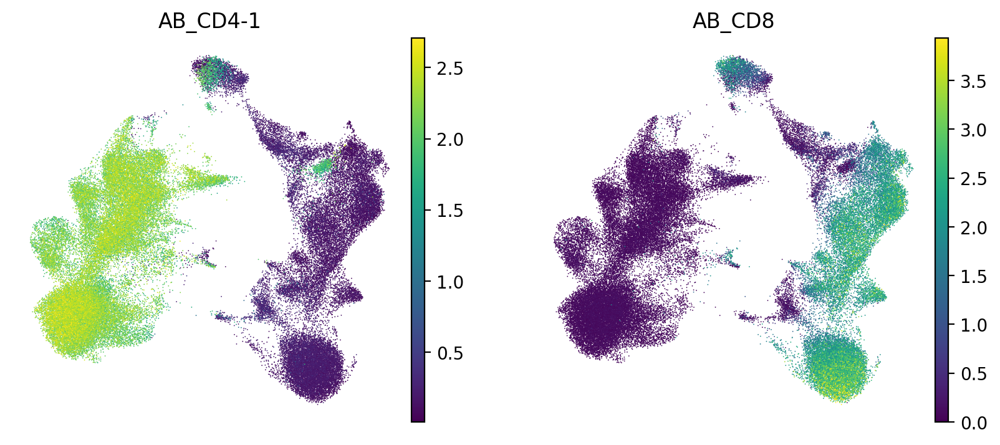

In [85]:
with rc_context({'figure.figsize': (4, 4), 'figure.dpi':200}):
    sc.pl.umap(adata, color=['AB_CD4-1', 'AB_CD8'], frameon=False, legend_fontsize=6, vmax='p99.9')

In [86]:
adata

AnnData object with n_obs × n_vars = 73259 × 15314
    obs: 'nCount_ADT', 'nFeature_ADT', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'lane', 'donor', 'time', 'celltype.l1', 'celltype.l2', 'celltype.l3', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'celltype.l3.merged', 'n_counts', 'pct_mito', 'leiden', 'CD4_Naive', '?MTRNR2L12', 'CD8_Naive', 'Translation', '?TXNIP/H3F3B', 'PoorQuality', 'CD4_CM-1', 'Effector_Memory', 'Cytotoxic', 'Mito', '?BCL2/CDK6', 'Cytoskeleton', 'Th17', 'IEG', 'Doublet_Myeloid', 'CD8_CD160high', 'MAIT', '?ANXA1/MYADM', '?AB_CD278/ACTG1', '?KLRC2/GNLY', '?NK-Like', 'Treg', 'HLA', 'IEG2', 'Doublet_Plasmablast', '?SOX4/MME', 'Th2', 'ISG', 'gdT', 'dnT/IL10+CD38+', 'CellCycle_S', 'CellCycle_Histone', 'Doublet_Platelet', 'CellCycle_G2M', 'Doublet_RBC'
    var: 'feature_types', 'highly_variable', 'mean', 'std'
    obsm: 'X_umap'

/PHShome/dk718/miniforge3/envs/cnmf_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


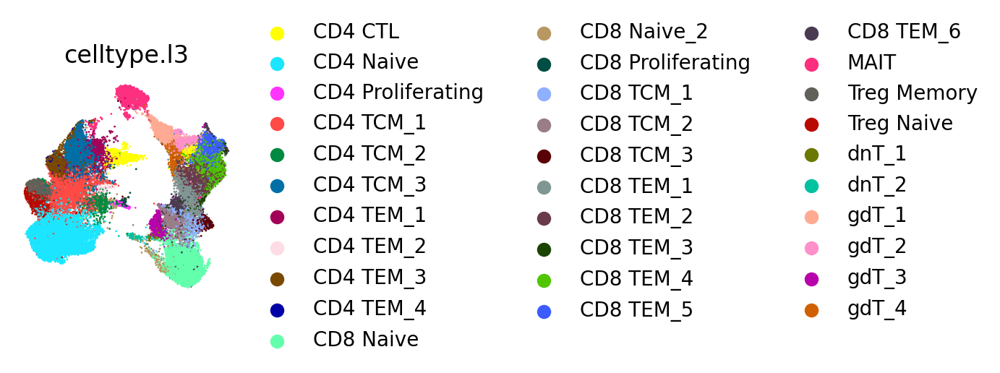

In [87]:
with rc_context({'figure.figsize': (2, 2), 'figure.dpi':200}):
    sc.pl.umap(adata, color='celltype.l3', size=4, frameon=False, vmax='p99.99')

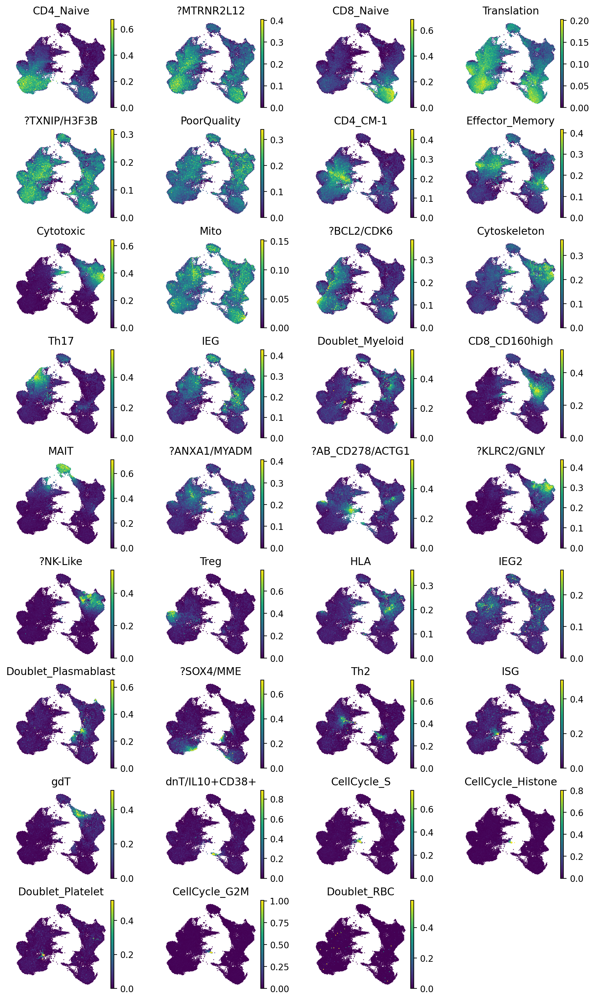

In [88]:
with rc_context({'figure.figsize': (2, 2), 'figure.dpi':200}):
    sc.pl.umap(adata, color=usage_lab.columns, size=4, frameon=False, vmax='p99.99')

/PHShome/dk718/miniforge3/envs/cnmf_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


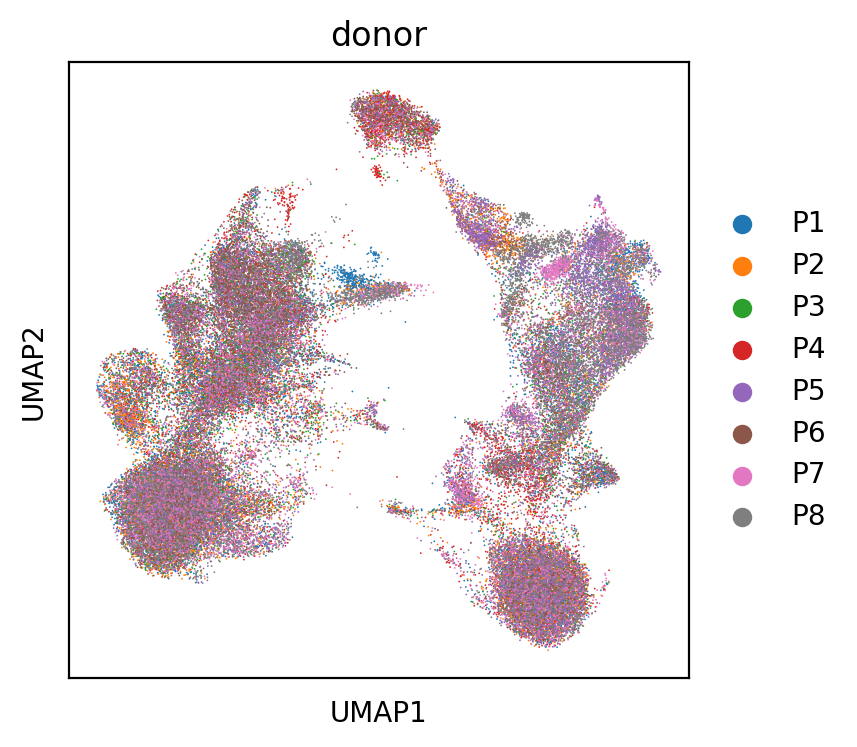

In [89]:
with rc_context({'figure.figsize': (4, 4), 'figure.dpi':200}):
    sc.pl.umap(adata, color='donor')

In [79]:
spectra_scores_lab.loc['GNLY',:].sort_values(ascending=False).head(10)

?KLRC2/GNLY        0.013804
gdT                0.002824
Cytotoxic          0.002699
?NK-Like           0.002134
HLA                0.001890
Mito               0.001464
Cytoskeleton       0.001161
CellCycle_G2M      0.000180
MAIT               0.000046
Doublet_Myeloid    0.000027
Name: GNLY, dtype: float64

In [78]:
spectra_scores_lab.loc['ITGB2',:].sort_values(ascending=False).head(10)

HLA                    0.005228
Cytoskeleton           0.005039
Doublet_Myeloid        0.003735
?NK-Like               0.002192
Mito                   0.001929
Cytotoxic              0.001684
?KLRC2/GNLY            0.001586
Doublet_Plasmablast    0.001456
gdT                    0.000634
?SOX4/MME              0.000314
Name: ITGB2, dtype: float64

In [77]:
spectra_scores_lab.loc[:,'Th2'].sort_values(ascending=False).head(10)

KRT1         0.018212
PTGDR2       0.015116
GATA3-AS1    0.013477
GATA3        0.012421
EDN3         0.010534
SEMA5A       0.010401
NEFL         0.009838
HPGDS        0.009610
IL17RB       0.009597
AB_CD49a     0.009557
Name: Th2, dtype: float64

<AxesSubplot: >

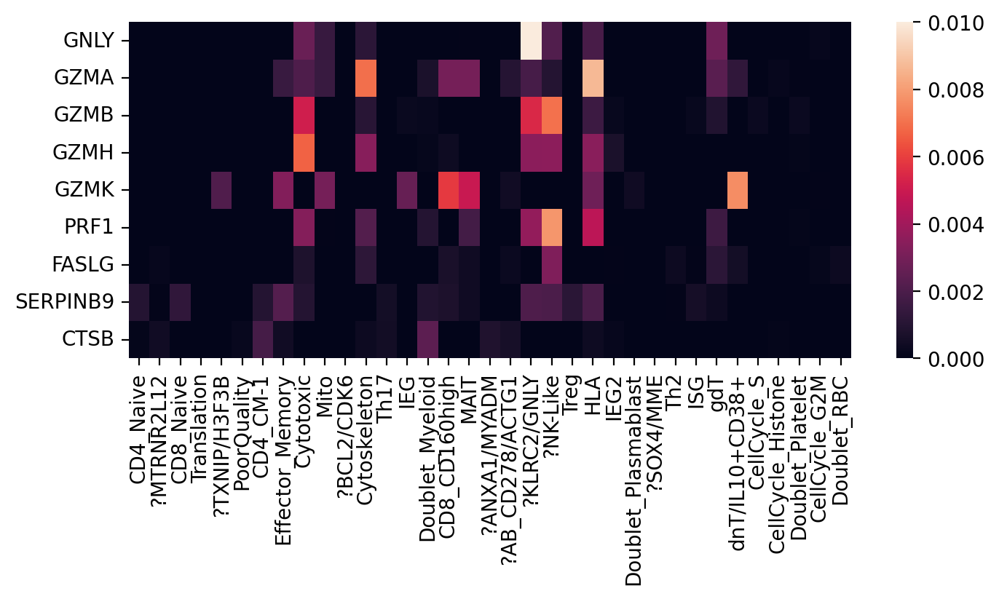

In [85]:
(fig,ax) = plt.subplots(1,1, figsize=(8,3), dpi=200)
sns.heatmap(spectra_scores_lab.loc[['GNLY', 'GZMA', 'GZMB', 'GZMH', 'GZMK', 'PRF1', 'FASLG', 'SERPINB9', 'CTSB'],:], vmax=.01, xticklabels=True, vmin=0)

In [91]:
spectra_scores_lab.loc['RORC', :].sort_values(ascending=False).head(10)

MAIT               0.003318
Th17               0.003147
?ANXA1/MYADM       0.000989
Doublet_RBC        0.000502
?MTRNR2L12         0.000294
?AB_CD278/ACTG1    0.000205
PoorQuality        0.000156
Mito               0.000060
ISG                0.000033
?SOX4/MME          0.000007
Name: RORC, dtype: float64

In [92]:
spectra_scores_lab.loc['CCR6', :].sort_values(ascending=False).head(10)

Th17                0.007918
MAIT                0.002379
CD4_CM-1            0.001556
IEG                 0.001178
Doublet_Platelet    0.000686
PoorQuality         0.000377
?MTRNR2L12          0.000171
Treg                0.000151
?SOX4/MME          -0.000030
IEG2               -0.000030
Name: CCR6, dtype: float64

In [93]:
spectra_scores_lab.loc['TNFRSF8', :].sort_values(ascending=False).head(10)

Doublet_Myeloid        0.000490
dnT/IL10+CD38+         0.000307
IEG2                   0.000255
HLA                    0.000194
?AB_CD278/ACTG1        0.000163
Doublet_Plasmablast    0.000149
Th2                    0.000140
Treg                   0.000135
MAIT                   0.000093
CD4_Naive              0.000092
Name: TNFRSF8, dtype: float64

In [94]:
spectra_scores_lab.loc['CCL5', :].sort_values(ascending=False).head(10)

?KLRC2/GNLY        0.006477
CD8_CD160high      0.005931
HLA                0.004276
Cytotoxic          0.004186
gdT                0.003420
Effector_Memory    0.003292
IEG2               0.001310
?NK-Like           0.001093
MAIT               0.000863
?AB_CD278/ACTG1    0.000786
Name: CCL5, dtype: float64

In [95]:
spectra_scores_lab.loc['PASK', :].sort_values(ascending=False).head(10)

CD4_CM-1               0.010126
CD8_Naive              0.004785
IEG                    0.000876
dnT/IL10+CD38+         0.000751
Doublet_Platelet       0.000391
Th17                   0.000242
Doublet_Plasmablast    0.000192
?KLRC2/GNLY            0.000185
Th2                    0.000180
CD8_CD160high          0.000136
Name: PASK, dtype: float64

In [96]:
tnsigs = pd.ExcelFile('../../Data/Misc/CanoGamez_2020_NatComms/41467_2020_15543_MOESM9_ESM.xlsx').parse('Data S5, TN signatures', skiprows=2)
tnsigs.index = tnsigs['gene']

tmsigs = pd.ExcelFile('../../Data/Misc/CanoGamez_2020_NatComms/41467_2020_15543_MOESM9_ESM.xlsx').parse('Data S5, TM signatures', skiprows=2)
tmsigs.index = tmsigs['gene']
tmsigs.head()

,cell_state,gene,specificity,p_value,p_adj
gene,,,,,
IFNG,Th1,IFNG,0.948998,0.0001,0.015933
ALDOC,Th1,ALDOC,0.791983,0.0002,0.015933
SNX30,Th1,SNX30,0.730276,0.0002,0.015933
DHRS9,Th17/iTreg,DHRS9,0.948608,0.0005,0.001070
TIMP1,Th17/iTreg,TIMP1,0.942013,0.0005,0.001070


<AxesSubplot: ylabel='cell_state'>

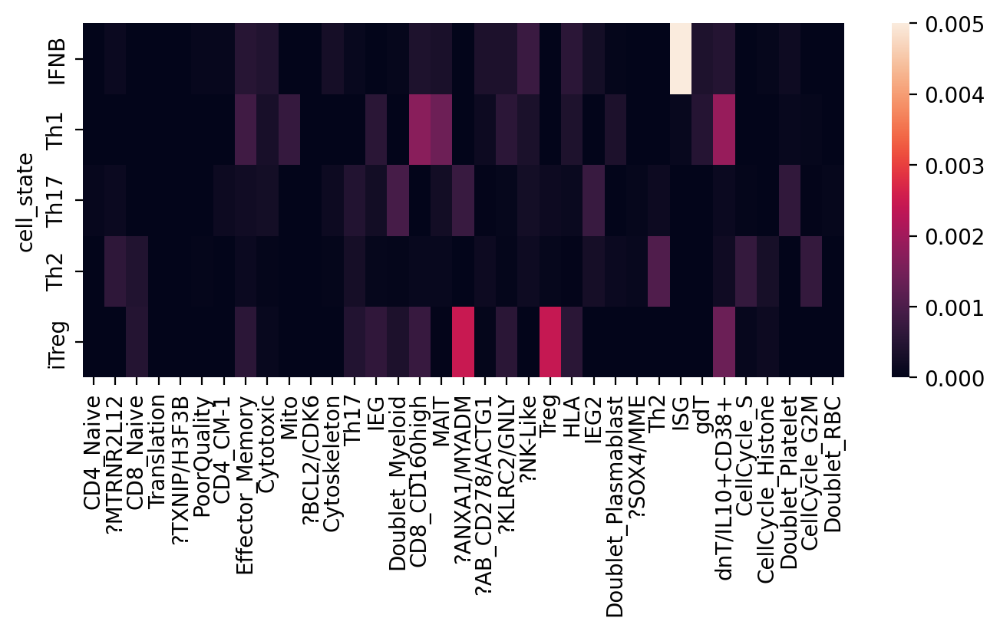

In [97]:
(fig,ax) = plt.subplots(1,1, figsize=(8,3), dpi=200)
sns.heatmap(spectra_scores_lab.groupby(tnsigs['cell_state']).mean(), vmax=.005, xticklabels=True, vmin=0)

<AxesSubplot: ylabel='cell_state'>

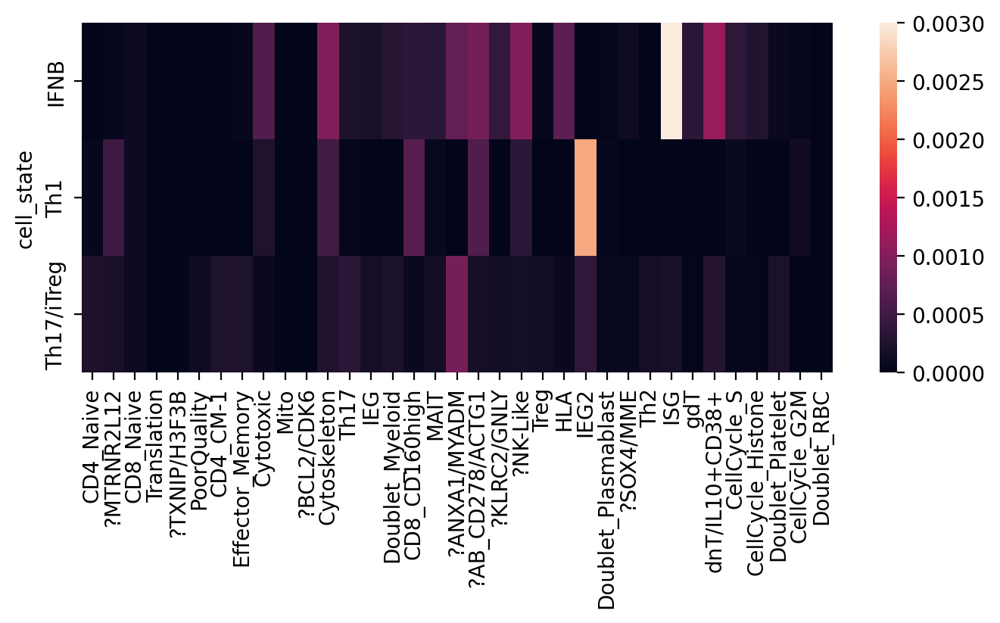

In [98]:
(fig,ax) = plt.subplots(1,1, figsize=(8,3), dpi=200)
sns.heatmap(spectra_scores_lab.groupby(tmsigs['cell_state']).mean(), vmax=.003, xticklabels=True, vmin=0)

In [99]:
tmsigs

,cell_state,gene,specificity,p_value,p_adj
gene,,,,,
IFNG,Th1,IFNG,0.948998,0.0001,0.015933
ALDOC,Th1,ALDOC,0.791983,0.0002,0.015933
SNX30,Th1,SNX30,0.730276,0.0002,0.015933
DHRS9,Th17/iTreg,DHRS9,0.948608,0.0005,0.001070
TIMP1,Th17/iTreg,TIMP1,0.942013,0.0005,0.001070
...,...,...,...,...,...
ANXA2,IFNB,ANXA2,0.763756,0.0001,0.005975
EVL,IFNB,EVL,0.762243,0.0047,0.083650
HERC6,IFNB,HERC6,0.746744,0.0001,0.005975


In [100]:
spectra_scores_lab.loc[['IFNG', 'ALDOC', 'SNX30'],'IEG']

IFNG    -0.000403
ALDOC   -0.000142
SNX30    0.000316
Name: IEG, dtype: float64

In [109]:
spectra_scores_lab.loc[:,'Effector_Memory'].sort_values(ascending=False).head(50)

IL7R             0.010741
LYAR             0.007618
PTGER2           0.006740
ITGA1            0.006722
CXCR3            0.005811
GBP5             0.004981
IFNG-AS1         0.004975
CYB561           0.004949
IGFBP3           0.004806
CCR9             0.004429
ANTXR2           0.004406
PRDM1            0.004374
NSG1             0.004295
PARP8            0.004282
GPR171           0.004234
ITGA4            0.004233
AB_CD49a         0.004150
CD2              0.004110
SAMSN1           0.004033
AB_CD2           0.003989
STOM             0.003966
TRADD            0.003959
AB_CD49d         0.003855
AB_Integrin-7    0.003844
ERN1             0.003824
AB_CD127         0.003766
TNFSF10          0.003643
GIMAP7           0.003625
GLIPR1           0.003598
PDE4B            0.003595
IL32             0.003445
IL10RA           0.003433
CLDND1           0.003405
TXNIP            0.003389
GBP4             0.003360
TIMP1            0.003350
CCL5             0.003292
GZMK             0.003284
ODF2L       

In [104]:
spectra_scores_lab.loc[:,'Th17'].sort_values(ascending=False).head(100).index

Index(['PTPN13', 'TNFRSF4', 'PDE4D', 'CCR6', 'CTSH', 'TNFRSF18', 'TTC39C-AS1',
       'TOB1', 'FRY', 'CR1', 'LTB', 'AB_CD196', 'USP10', 'TIMP1', 'RORA',
       'AQP3', 'AUTS2', 'KIF5C', 'TPO', 'IL4I1', 'COL5A3', 'IL7R', 'NPDC1',
       'OSM', 'FUT7', 'ANK1', 'GREM2', 'CFH', 'ADAM23', 'LGALS3', 'TNFSF13B',
       'FRMD4B', 'HSD11B1', 'AB_CD26-2', 'SASH1', 'CMTM6', 'TMEM273',
       'B3GALT2', 'AB_CD117', 'NEFL', 'AB_CD109', 'TRIQK', 'TNFAIP3', 'YWHAH',
       'DST', 'AB_CD307e', 'RIPK2', 'DUSP16', 'BHLHE40', 'GRASP', 'MCAM',
       'ERN1', 'RORC', 'LTK', 'TSPAN18', 'ZNF462', 'ELK3', 'CYP4B1', 'RUNX2',
       'AB_CD106', 'S100A4', 'MAP3K1', 'IL1R1', 'AB_CD209', 'VIM', 'ADAM19',
       'LINC01644', 'AB_CD127', 'MAP3K4', 'NCAPG2', 'ELOVL4', 'KDSR', 'NSG1',
       'MAF', 'REEP3', 'USP46', 'TNFRSF25', 'AB_CD4-1', 'FKBP11', 'AB_CD2',
       'MB21D2', 'ZFP36L1', 'DPP4', 'AFDN', 'NTN4', 'DAB1', 'PI16', 'HLF',
       'JUN', 'CCR2', 'SATB1', 'NOSIP', 'MCOLN3', 'BIRC3', 'AB_CD29',
       'AB_CD28'

In [108]:
spectra_scores_lab.loc['IL26', :].sort_values(ascending=False)

CellCycle_S            0.001311
HLA                    0.000834
?ANXA1/MYADM           0.000579
MAIT                   0.000498
CellCycle_G2M          0.000477
?AB_CD278/ACTG1        0.000441
PoorQuality            0.000377
Th17                   0.000209
Doublet_Plasmablast    0.000150
IEG2                   0.000133
CD8_Naive              0.000066
CD4_Naive              0.000055
?MTRNR2L12             0.000040
?SOX4/MME              0.000028
?NK-Like              -0.000012
Cytoskeleton          -0.000012
IEG                   -0.000039
CD8_CD160high         -0.000052
Effector_Memory       -0.000072
Doublet_RBC           -0.000098
CD4_CM-1              -0.000101
gdT                   -0.000118
Cytotoxic             -0.000136
Doublet_Myeloid       -0.000136
Th2                   -0.000149
?TXNIP/H3F3B          -0.000155
Treg                  -0.000161
?BCL2/CDK6            -0.000203
?KLRC2/GNLY           -0.000209
dnT/IL10+CD38+        -0.000280
Doublet_Platelet      -0.000359
Translat

In [105]:
spectra_scores_lab.loc['TBX21', :].sort_values(ascending=False)

Cytotoxic              0.003247
?KLRC2/GNLY            0.003143
?NK-Like               0.002896
gdT                    0.002496
CD8_CD160high          0.001030
Doublet_Platelet       0.000946
Doublet_Plasmablast    0.000589
MAIT                   0.000398
?ANXA1/MYADM           0.000318
ISG                    0.000242
CellCycle_G2M          0.000184
Cytoskeleton           0.000066
Effector_Memory        0.000003
?AB_CD278/ACTG1       -0.000030
PoorQuality           -0.000040
?MTRNR2L12            -0.000087
IEG                   -0.000122
CellCycle_Histone     -0.000175
?SOX4/MME             -0.000203
Th17                  -0.000282
dnT/IL10+CD38+        -0.000291
CellCycle_S           -0.000312
CD4_CM-1              -0.000344
Treg                  -0.000391
Doublet_Myeloid       -0.000406
IEG2                  -0.000431
Th2                   -0.000432
?BCL2/CDK6            -0.000465
CD4_Naive             -0.000465
CD8_Naive             -0.000466
Doublet_RBC           -0.000561
Mito    

In [106]:
spectra_scores_lab.loc[:,'Effector_Memory'].sort_values(ascending=False).head(50)

IL7R             0.010741
LYAR             0.007618
PTGER2           0.006740
ITGA1            0.006722
CXCR3            0.005811
GBP5             0.004981
IFNG-AS1         0.004975
CYB561           0.004949
IGFBP3           0.004806
CCR9             0.004429
ANTXR2           0.004406
PRDM1            0.004374
NSG1             0.004295
PARP8            0.004282
GPR171           0.004234
ITGA4            0.004233
AB_CD49a         0.004150
CD2              0.004110
SAMSN1           0.004033
AB_CD2           0.003989
STOM             0.003966
TRADD            0.003959
AB_CD49d         0.003855
AB_Integrin-7    0.003844
ERN1             0.003824
AB_CD127         0.003766
TNFSF10          0.003643
GIMAP7           0.003625
GLIPR1           0.003598
PDE4B            0.003595
IL32             0.003445
IL10RA           0.003433
CLDND1           0.003405
TXNIP            0.003389
GBP4             0.003360
TIMP1            0.003350
CCL5             0.003292
GZMK             0.003284
ODF2L       

In [111]:
stephenson_scores = pd.read_csv('/data/srlab1/mcurtis/GSK/tcell_proliferation/Covid_Stephenson/cnmf_output/Haniffa_T_Script_learnHarmonyRNA_RefitBoth/Haniffa_T_Script_learnHarmonyRNA_RefitBoth.gene_spectra_score.k_40.dt_0_2.labeled.txt', sep='\t', index_col=0).T
stephenson_scores.head()

,CD4_Naive,Translation,Cytotoxic,Ribosomal,IEG1,Cytoskeleton,PoorQuality,CD8_CD160high,CD8_Naive,KRT1/CCR4,...,CellCycle_Histone,Metallothionein,CellCycle_G2M,Th2,dnT2,CRHBP/EGFL7,Doublet_RBC,ITGA2/GATA2,CPA3/CALN1,KRT17/DDAH1
FAM87B,-3.580068e-05,-0.000006,-0.000022,-0.000038,-0.000064,-0.000148,0.000140,0.000050,1.641249e-07,-0.000005,...,-1.673743e-08,-0.000045,-0.000026,0.000076,-0.000060,-0.000025,-0.000036,0.000022,0.000015,0.000032
LINC00115,-1.798016e-04,-0.000239,0.000035,-0.000224,-0.000039,-0.000026,0.000583,-0.000063,-7.764773e-05,0.000054,...,-3.467532e-05,0.000067,-0.000001,-0.000105,-0.000063,0.000002,-0.000185,0.000327,-0.000145,-0.000050
FAM41C,3.814940e-04,-0.000306,0.000013,-0.001012,0.000804,-0.000159,-0.000265,-0.000026,3.194744e-04,0.000008,...,3.665722e-06,0.000120,0.000021,0.000121,-0.000109,0.000095,0.000200,-0.000140,0.000275,0.000033
NOC2L,-1.655422e-04,-0.000562,-0.000133,-0.000120,-0.000061,0.000439,0.000953,0.000032,1.888578e-07,-0.000199,...,-5.430357e-05,-0.000361,-0.000102,0.000041,0.000375,0.000029,-0.000349,0.000139,-0.000148,0.000480
KLHL17,-8.919642e-07,-0.000105,0.000063,-0.000454,-0.000041,-0.000111,0.000284,0.000028,-6.659594e-05,-0.000019,...,-1.634762e-05,0.000594,-0.000020,0.000116,0.000072,-0.000059,-0.000059,0.000103,-0.000026,0.000011


In [112]:
stephenson_scores.columns

Index(['CD4_Naive', 'Translation', 'Cytotoxic', 'Ribosomal', 'IEG1',
       'Cytoskeleton', 'PoorQuality', 'CD8_CD160high', 'CD8_Naive',
       'KRT1/CCR4', 'BCL2/CDK6', 'LIMS1/PASK', 'Th17', 'Mito', 'IEG2', 'ISG',
       '?ANXA1/MYADM', 'Doublet_Plasmablast', '?Doublet_Myeloid', 'Treg',
       'NME1/FABP5', 'MAIT', 'gdT', 'KLRC2/GNLY', 'HLA', 'IEG3', 'CellCycle_S',
       'Doublet_Platelet', 'TNF/IFNG', 'dnT1/CD38', 'CellCycle_Histone',
       'Metallothionein', 'CellCycle_G2M', 'Th2', 'dnT2', 'CRHBP/EGFL7',
       'Doublet_RBC', 'ITGA2/GATA2', 'CPA3/CALN1', 'KRT17/DDAH1'],
      dtype='object')

/tmp/ipykernel_56686/475075973.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), fontsize=7)
/tmp/ipykernel_56686/475075973.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=7)


Text(-0.0025, 0.01, 'R:0.698')

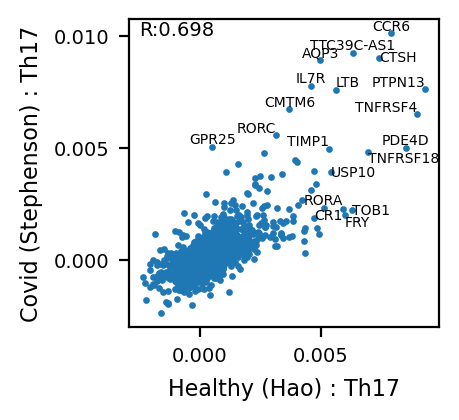

In [160]:
g1 = 'Th17'
g2 = 'Th17'
x = spectra_scores_lab.loc[overlap, g1]
y = stephenson_scores.loc[overlap, g2]
overlap = list(set(stephenson_scores.index).intersection(spectra_scores_lab.index))
(fig,ax) = plt.subplots(1,1, figsize=(2,2), dpi=200)
ax.scatter(x, y, s=2)
tolab = list(x.index[(x>.005) | (y>.005)])
ax.set_xticklabels(ax.get_xticklabels(), fontsize=7)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=7)
ax.set_xlabel('Healthy (Hao) : %s' % g1, fontsize=8)
ax.set_ylabel('Covid (Stephenson) : %s' % g2, fontsize=8)

for l in tolab:
    if l in ['TIMP1', 'RORC', 'TNFRSF4', 'PTPN13']:
        ax.text(x=x.at[l], y=y.at[l], s=l, fontsize=5, va='bottom', ha='right')   
    elif l in ['LTB']:
        ax.text(x=x.at[l], y=y.at[l], s=l, fontsize=5, va='bottom', ha='left')   
    elif l in ['CTSH', 'USP10', 'TOB1']:
        ax.text(x=x.at[l], y=y.at[l], s=l, fontsize=5, va='center', ha='left') 
    elif l in ['FRY', 'TNFRSF18']:
        ax.text(x=x.at[l], y=y.at[l], s=l, fontsize=5, va='top', ha='left') 
    elif l in ['CR1']:
        ax.text(x=x.at[l], y=y.at[l], s=l, fontsize=5, va='top', ha='right') 

    else:
        ax.text(x=x.at[l], y=y.at[l], s=l, fontsize=5, va='bottom', ha='center')
        
ax.text(-.0025, .01, 'R:%.3f' % pearsonr(x,y)[0], fontsize=7)

In [155]:
pearsonr(x,y)[0]

0.6978711282288975

In [147]:
stephenson_scores['Th17'].sort_values(ascending=False).head(50)

CCR6          0.010093
TTC39C-AS1    0.009228
CTSH          0.009005
AQP3          0.008926
IL7R          0.007761
PTPN13        0.007615
LTB           0.007584
CMTM6         0.006720
TNFRSF4       0.006479
RORC          0.005550
AB_DPP4       0.005534
GPR25         0.005044
PDE4D         0.004993
TIMP1         0.004960
TNFRSF18      0.004812
NSG1          0.004740
TNFSF13B      0.004466
AB_IL7R       0.004435
LGALS3        0.004340
NR1D1         0.004259
IL4I1         0.003968
KLRB1         0.003900
USP10         0.003899
YWHAH         0.003829
AB_CD2        0.003751
S100A4        0.003680
AB_CD4        0.003674
AB_CD28       0.003641
TPO           0.003379
TTC39C        0.003370
LIMS1         0.003337
ZFP36L1       0.003205
NPDC1         0.003131
VIM           0.003059
CD40LG        0.002993
ITM2B         0.002943
CCL20         0.002937
AB_ITGA4      0.002885
CFH           0.002680
AB_ITGA6      0.002665
NCF4          0.002655
PTGER2        0.002565
TSPAN15       0.002551
S100A11    

In [149]:
[x for x in stephenson_scores.index if 'IL17' in x]

['IL17RE',
 'IL17RC',
 'IL17RB',
 'IL17RD',
 'IL17A',
 'IL17F',
 'IL17D',
 'IL17C',
 'IL17RA']

In [151]:
stephenson_scores.loc['IL17A', :].sort_values(ascending=False)

Th17                   1.386014e-03
Doublet_Plasmablast    6.157217e-04
HLA                    3.321502e-04
CD4_Naive              1.431471e-04
CD8_Naive              1.226040e-04
dnT1/CD38              1.224566e-04
LIMS1/PASK             5.944245e-05
Th2                    5.836900e-05
gdT                    4.496411e-05
KLRC2/GNLY             4.389653e-05
IEG1                   3.139428e-05
Cytotoxic              1.760988e-05
Treg                   1.683866e-05
KRT17/DDAH1            1.359704e-05
PoorQuality            1.312837e-05
NME1/FABP5             9.472710e-06
CellCycle_Histone      8.119974e-06
CellCycle_G2M          6.671116e-07
CellCycle_S           -7.487920e-07
ITGA2/GATA2           -9.779008e-06
dnT2                  -1.148775e-05
CD8_CD160high         -1.385870e-05
TNF/IFNG              -2.282528e-05
CPA3/CALN1            -3.686451e-05
CRHBP/EGFL7           -4.744219e-05
Doublet_RBC           -6.677403e-05
KRT1/CCR4             -7.581861e-05
ISG                   -8.351

In [168]:
top_genes.loc[:,['dnT/IL10+CD38+','?AB_CD278/ACTG1']].head(25)

,dnT/IL10+CD38+,?AB_CD278/ACTG1
0,CAV1,AB_CD278
1,MYB,ACTG1
2,MIR4422HG,MIR4435-2HG
3,FXYD2,NEAT1
4,SESTD1,GAPDH
5,AB_CD38-1,CTLA4
6,IL10,CYTOR
7,ZBTB32,MXD4
8,AB_CD38-2,ACTB
9,HAVCR2,DUSP4


In [164]:
spectra_scores_lab.columns

Index(['CD4_Naive', '?MTRNR2L12', 'CD8_Naive', 'Translation', '?TXNIP/H3F3B',
       'PoorQuality', 'CD4_CM-1', 'Effector_Memory', 'Cytotoxic', 'Mito',
       '?BCL2/CDK6', 'Cytoskeleton', 'Th17', 'IEG', 'Doublet_Myeloid',
       'CD8_CD160high', 'MAIT', '?ANXA1/MYADM', '?AB_CD278/ACTG1',
       '?KLRC2/GNLY', '?NK-Like', 'Treg', 'HLA', 'IEG2', 'Doublet_Plasmablast',
       '?SOX4/MME', 'Th2', 'ISG', 'gdT', 'dnT/IL10+CD38+', 'CellCycle_S',
       'CellCycle_Histone', 'Doublet_Platelet', 'CellCycle_G2M',
       'Doublet_RBC'],
      dtype='object')